In [63]:
import numpy as np
import pandas as pd
import cv2
import os, glob
import nltk
from nltk.stem import WordNetLemmatizer
import re
from nltk.corpus import stopwords
import spacy
import keras

json_file = open('model_30.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = keras.models.model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("./model_weights/model_30.json")
print("Loaded model from disk")

Loaded model from disk


In [64]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [11]:
import pickle

train_features = pickle.load(open("./encoded_train_images.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [17]:
train = pd.read_csv('./dataset-flick8k/caption-token.csv', delimiter = '\t', header = None)
train.info()

file = open("./dataset-flick8k/Flickr_8k.trainImages.txt", 'r')
train_images = []
cnt = 0
while 1:
    s = file.readline()
    cnt += 1
    if s == "":
        break
    s = s[:len(s)-1]
    train_images.append(s)

cnt = 0
train_caption = {}
des = {}

for i in range(0, len(train)):
    img = train[0][i]
#     print(i)
#     print(img)
    img = img[:len(img)-2]
    if img in train_images:
        if img not in des:
            des[img] = list()
        
        des[img].append("startseq " + train[1][i] + " endseq")

# print(des)
print(len(des))

def clean_text(text):
    text = re.sub('[^a-zA-Z]',' ',text)
    text = text.lower()
    text = text.split()
    lemmatizer = WordNetLemmatizer()
    text = [lemmatizer.lemmatize(word) for word in text] 
    final = []
    for word in text:
        if word != "-PRON-":
            final.append(word)
    text = ' '.join(final)
    return text
    
image_id = []
corpus = []    

for key in des:
    for line in des[key]:
        text = clean_text(line)
        image_id.append(key)
        corpus.append(text)

# print(corpus)
print(len(corpus))

word_count = {}

for text in corpus:
    print(text)
    for w in text.split(' '):
        word_count[w] = word_count.get(w, 0) + 1
    
vocab = [w for w in word_count if word_count[w] >= 10]

print(len(vocab))

captions = []

for text in corpus:
    for w in text.split(' '):
        tmp = []
        if w in vocab:
            tmp.append(w)
        tmp =  ' '.join(tmp)
        print(tmp)
        captions.append(tmp)

ixtoword = {}
wordtoix = {}

ix=1

for w in vocab: 
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40460 entries, 0 to 40459
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       40460 non-null  object
 1   1       40460 non-null  object
dtypes: object(2)
memory usage: 632.3+ KB
6000
30000
startseq a child in a pink dress is climbing up a set of stair in an entry way endseq
startseq a girl going into a wooden building endseq
startseq a little girl climbing into a wooden playhouse endseq
startseq a little girl climbing the stair to her playhouse endseq
startseq a little girl in a pink dress going into a wooden cabin endseq
startseq a black dog and a spotted dog are fighting endseq
startseq a black dog and a tri colored dog playing with each other on the road endseq
startseq a black dog and a white dog with brown spot are staring at each other in the street endseq
startseq two dog of different breed looking at each other on the road endseq
startseq two dog on pavement movin

startseq a woman in a white hat holding money and her bag endseq
startseq a woman juggle her baby purse money and food from a market endseq
startseq a woman wearing a white hat and carrying a baby a grocery bag and a blue tote bag sort her money endseq
startseq a woman wearing a white hat is carrying a baby whilst shopping in a market for grocery endseq
startseq a girl who is surrounded by other people is taking a picture at a concert endseq
startseq a group of men and woman are facing in the direction of something that is happening off camera endseq
startseq a group of people gathered at night watching an event endseq
startseq a group of people gathered for an event endseq
startseq several people are gathered and watching an event endseq
startseq a black and tan puppy is biting the ear of a brown dog endseq
startseq a black puppy chewing on a brown dog s neck endseq
startseq a black puppy chewing on an adult brown dog endseq
startseq a small puppy stand on his hind leg to bite a bigge

startseq the skateboarder is performing a trick off a ramp endseq
startseq the skateboarder launch off a quarter pipe endseq
startseq a man in swim trunk hit a ball with a paddle while on the beach endseq
startseq a man is batting a ball on the beach beside the ocean endseq
startseq a muscular man in swim trunk play paddle ball on the beach endseq
startseq man in a bathing suit holding a paddle on the beach endseq
startseq the man is standing on the shore hitting a ball with a paddle endseq
startseq a man in an orange shirt and a blue hardhat smile endseq
startseq a man smiling with a helmet on his head endseq
startseq a man wearing a helmet and sunglass smile endseq
startseq a man wearing an orange shirt and helmet endseq
startseq a man with a blue helmet and orange shirt endseq
startseq a man in a grey suit kneel in front of a woman in a white dress endseq
startseq a man is removing a garter for a lady endseq
startseq a man putting a garter on a woman endseq
startseq a woman sitting 

startseq a multicolor puppy running on the lawn beside a road endseq
startseq a puppy running along a street endseq
startseq a small dog is running on the grass beside the road endseq
startseq a black and brown dog is running on the beach endseq
startseq a brown and black dog walk along a rocky beach endseq
startseq a dog running on the beach endseq
startseq a shepherd breed dog running on the beach endseq
startseq a wet german shepherd run along the wave on a beach endseq
startseq three child are playing soccer in the sand endseq
startseq three people kicking a ball in the sand endseq
startseq three people playing with a red ball in a large sandy area with a tree in the background endseq
startseq three people play soccer in the sand endseq
startseq two boy and a girl kick a ball in a sandy field endseq
startseq a boy swing on the swing endseq
startseq a little boy in a striped shirt laying on his belly on a swing endseq
startseq a young blond boy swing nearly upside down in his chair 

startseq two men sitting on opposite side of a bus stop endseq
startseq two people wait at an enclosed bus stop on a bench with advertisement present endseq
startseq a couple is enjoying the view of the water while sitting on a patio endseq
startseq a couple sit on a patio overlooking the ocean endseq
startseq couple sitting on chair by a stone wall overlooking the ocean endseq
startseq two adult sitting in chair overlooking the ocean endseq
startseq two people sit on a well kept stone path that overlook a large body of water endseq
startseq a man sits in a camping chair near the edge of a rock face over a body of water endseq
startseq a man sits in a chair while holding a large pole endseq
startseq a man sits on a folding chair on big block of ice holding on to a rope endseq
startseq man sits on chair near edge of cliff fishing endseq
startseq the man hold a pole in the air while sitting close to the cliff edge endseq
startseq a girl in black sitting on a man s lap on a subway endseq


startseq a golden dog ha a long stick in it mouth endseq
startseq a golden retriever is biting a branch in a yard endseq
startseq a yellow dog play with a large stick in the grass endseq
startseq a man controlling a dog sled approach another dog sled team in a narrow snowy passageway between two set of tree endseq
startseq dog performing a sled race endseq
startseq sled and dog headed towards another group of sled dog with one loose endseq
startseq two group of husky are running in the snow each group pulling a man endseq
startseq two pack of sled dog meet endseq
startseq a few men sprint across the grass in competition with one another endseq
startseq a man in a grey shirt is winning a race in the grass endseq
startseq a man lead the way in a race endseq
startseq people running a race and the guy in grey is in the lead endseq
startseq two men running outside in a competition endseq
startseq a person on a bike jumping over a bench in the park endseq
startseq a person on a bmx bike leap

startseq a yellow dog with a collar running in a wooded area endseq
startseq brown and tan dog run through brown leafy terrain endseq
startseq pale brown dog run in blurred rural scene endseq
startseq a basketball player hold the ball during a game endseq
startseq man with a basketball in a florida uniform endseq
startseq the basketball player in white is holding an orange basketball endseq
startseq the basketball player is wearing a florida jersey endseq
startseq there is a florida college player dribbling the ball endseq
startseq a child get ready to hike the ball to another endseq
startseq two boy playing flag football with purple jersey endseq
startseq two child are playing flag football together endseq
startseq two child are playing with a football on the grass endseq
startseq two little boy playing flag football in purple jersey endseq
startseq a man with rock climbing equipment is hanging from a vertical white rock endseq
startseq a woman climbing a rocky cliff endseq
startseq a

startseq a child in a red hoodie and black pant ice skating in a rink endseq
startseq a kid in a red sweatshirt ice skating endseq
startseq kid in red sweatshirt ice skating endseq
startseq young boy in red hoodie ice skating endseq
startseq a large crowd dressed in renaissance attire gather together in a city street endseq
startseq people are dressed in victorian outfit in a crowded outdoor area endseq
startseq some people in medieval costume are walking through a crowded street endseq
startseq street scene of elegant dressed people of older time endseq
startseq there is a large gathering of people in costume outside on the street endseq
startseq a little girl on the sidewalk close to the road is playing with three hula hoop endseq
startseq a little girl play with a hula hoop on the sidewalk in a residential neighborhood endseq
startseq a small child is playing with hula hoop in a yard of a neighborhood endseq
startseq a small girl dressed in a red sweater playing hula hoop on a sidew

startseq two little kid walk side by side while one eats something endseq
startseq two young child walking on a tiled floor endseq
startseq a biker doing a jump in a forest endseq
startseq a boy doing a jump on his bike in the wood endseq
startseq a boy on a mountain bike land after a jump while riding in the forest endseq
startseq a guy racing his motorcycle on a trail endseq
startseq a man is riding his bicycle through the wood endseq
startseq a black dog and a brindle dog wrestle in the dry grass beside a body of water endseq
startseq a large black dog fighting with another large brown and black dog endseq
startseq two dog fight or play in a field endseq
startseq two dog in a rocky field face to face with a stick between them endseq
startseq two dog nussle one another in the grass near a lake endseq
startseq a basketball team of girl is doing a hand huddle endseq
startseq a group of basketball player in a huddle endseq
startseq a sport team is in a huddle with hand together endseq
s

startseq a dog playing frisbee in the front yard next to a car endseq
startseq a white dog catch a red frisbee in the grass endseq
startseq a white dog jumping in the air to catch a red frisbee endseq
startseq the dog leap to catch the frisbee in it mouth endseq
startseq a bicyclist is attempting a trick over a jump nearby a bush and wooden building endseq
startseq a biker spin his bike in the air above the ground endseq
startseq an extreme cyclist flying through the air on his green bike in a rural area endseq
startseq a person on a bike get airborne endseq
startseq person jumping bicycle off cliff beside building on hill endseq
startseq a convoy of military truck are lined up in a lot endseq
startseq a line of military truck are passing by a soldier who is walking away endseq
startseq a man in a military uniform is walking away from a line of military vehicle endseq
startseq a military man walk away from a line of army vehicle endseq
startseq army vehicle line up and a soldier walk n

startseq two boy looking out the window of an rv endseq
startseq two boy peer out the window of a rv while one hold a stuffed toy endseq
startseq two child peek out the window of an rv with a pet snake endseq
startseq two young boy lean out the window of a white rv with their stuffed toy snake endseq
startseq a man and a woman sit back to back on a bench in front of a building with a colorful painted door endseq
startseq a man and a woman sit back to back on a bench outside a storefront endseq
startseq a man and woman sitting back to back outside a building endseq
startseq a man and woman sitting back to back outside in the sun endseq
startseq two people are sitting on a bench outside of a decorative building endseq
startseq a couple and their baby feed pigeon at a park endseq
startseq a family sits at a park while bird fly around endseq
startseq a large flock of pigeon is swarming at a man endseq
startseq a man and a woman and a young child surrounded by various bird endseq
startseq a

startseq man on electric scooter looking at shelf of shoe endseq
startseq senior citizen shop for shoe with a sombrero on his head endseq
startseq a man in bright clothing play an instrument on the street endseq
startseq a man wearing a colorful and striped sweater play music in the street endseq
startseq a man wearing a multi color coat is playing the guitar on the street endseq
startseq a man wearing a multicolored striped shirt playing the guitar on the street endseq
startseq street performer in colorful shirt performing with small guitar endseq
startseq a couple hugging with other people standing around in front of some building endseq
startseq a man and a woman hug on a street endseq
startseq the man in the red shirt is taking a photo of the couple that is hugging on the sidewalk endseq
startseq the man in the red shirt is taking a picture of the two people hugging endseq
startseq two people share a hug endseq
startseq a big tri colored and a smaller puppy with light blue eye are 

a
bench
outside
with
a
white
and
black
dog
sitting
next
to
him
endseq
startseq
a
shirtless
man
lie
on
a
park
bench
with
his
dog
endseq
startseq
man
laying
on
bench
holding
leash
of
dog
sitting
on
ground
endseq
startseq
a
man
in
an
orange
hat

at
something
endseq
startseq
a
man
wear
an
orange
hat
and
glass
endseq
startseq
a
man
with

and
glass
is
wearing
a

hat
endseq
startseq
a
man
with
glass
is
wearing
a
beer
can

hat
endseq
startseq
the
man
with

ear
is
wearing
glass
and
an
orange
hat
endseq
startseq
a
child
playing
on
a
rope
net
endseq
startseq
a
little
girl
climbing
on
red

endseq
startseq
a
little
girl
in
pink
climb
a
rope
bridge
at
the
park
endseq
startseq
a
small
child

onto
the
red
rope
at
the
playground
endseq
startseq
the
small
child
climb
on
a
red
rope
on
a
playground
endseq
startseq
a
black
and
white
dog
is
running
in
a
grassy
garden
surrounded
by
a
white
fence
endseq
startseq
a
black
and
white
dog
is
running
through
the
grass
endseq
startseq
a

terrier
is
running
in
the
gr

endseq
startseq
a
group
of
hot
air
balloon
lit
up
at
night
endseq
startseq
people
are
watching
hot
air
balloon
in
the
park
endseq
startseq
people
watching
hot
air
balloon
endseq
startseq
seven
large
balloon
are
lined
up
at

near
a
crowd
endseq
startseq
a
child
with
a
helmet
on
his
head
ride
a
bike
endseq
startseq
a
little
boy
ride
a
bike
down
a
hill
on
a

dirt
bike
endseq
startseq
a
young
boy
in
a
helmet
ride
a
bike
on
the
road
endseq
startseq
the
little
boy
ride
his
bicycle
in
a
race
endseq
startseq
the
young
boy

quickly
at
a
bmx
race
endseq
startseq
a
man
in
a
brown
shirt
and
dark
short
play
on
the
beach
with
his
two
black
dog
endseq
startseq
a
man
in
short
with
two
black
dog
hold
a
ball
throwing
toy
at
the
beach
endseq
startseq
a
man
playing
with
two
black
dog
on
the
beach
endseq
startseq
a
man
with
two
dog
on
a
beach
endseq
startseq
man
at
the
beach
with
two
dog
endseq
startseq
a
boy

the
bubble
off
his
face
endseq
startseq
a
boy
covered
in

ha
his
face


endseq
startseq
a
boy
is


a
brown
black
and
white
dog
is
running
through
a
large
field
with
it
mouth
open
endseq
startseq
a
dog
running
in
a
field
endseq
startseq
a
dog
with
it
mouth
open
running
through
a
field

the
camera
endseq
startseq
a
girl
in
a
pink
swimsuit
in
a
pool
endseq
startseq
a
girl
swimming
in
a
pool
endseq
startseq
a
little
girl
in
a
pink
bathing
suit
swimming
in
a
pool
endseq
startseq
a
little
girl
swimming
in
a
pool
endseq
startseq
smiling
little
girl
swimming
in
outdoor
pool
endseq
startseq
a
child
is
standing
on
her
head
endseq
startseq
a
little
girl
standing
on
her
head
endseq
startseq
a
small
child
doing
a
handstand
on
a
bed
endseq
startseq
a
young
girl
doe
a
handstand
on
a
bed
with
blue
sheet
endseq
startseq
the
girl
is
upside
down
on
a
bed
endseq
startseq
a
guy
stand
in
the
sand
with
a
snowboard
behind
him
endseq
startseq
a
man
hold
a
surfboard
on
the
beach
endseq
startseq
a
man
hold
his
snowboard
in
the
sand
endseq
startseq
a
man
with
his
surfboard
stand
in
the
sand
endseq
startseq
man

from
a
rope
above
the
building
endseq
startseq
a
boy
pose
for
a
picture
and
in
the
background
a
man
is
hanging
by
a
rope
endseq
startseq
a
boy
stand
near
a
structure
outside
endseq
startseq
a
young
man
wearing
a
blue
shirt
with
a
strange
white
building
in
the
background
endseq
startseq
a
girl
in
a
brown
dress
surrounded
by
child
close
her
eye
endseq
startseq
a
girl
in
a
yellow
dress
with
the
sun

on
her
face
endseq
startseq
a
girl
in
yellow
dress
is
standing
with
her
eye
closed
in
a
busy
park
endseq
startseq
a
young
girl
in
a
white
dress
endseq
startseq
child
at
a
park
endseq
startseq
a
man
in
a
black
jacket
is
taking
a
photo
of
a
man
in
a
red
jacket
endseq
startseq
a
man
in
a
black
outfit
is
taking
a
photograph
of
a
man
in
a
red
jacket
endseq
startseq
a
man
take
a
picture
of
another
man
in
an
open
area
just
off
of
a
busy
street
endseq
startseq
a
young
man
taking
a
picture
of
another
young
man
outdoors
endseq
startseq
young
man
take
picture
of
another
young
man
in
front
of
church
endse

few
adult
get
splashed
by
an
off
camera

endseq
startseq
a
group
of
child
are
in
a
water
fountain
endseq
startseq
a
group
of
child
standing
in
a
shallow
pool
of
water
endseq
startseq
a
group
of
young
kid
play
in
the
water
on
a
sunny
day
endseq
startseq
child
and
adult
play
with
a
sprinkler
endseq
startseq
a
man
standing
on
a
rocky
mountain
with
gray
cloud
in
the
background
endseq
startseq
a
man
without
a
shirt
is
walking
on
top
of
lot
of
rock
endseq
startseq
a
shirtless
man
is
walking
on
a
rocky
hill
endseq
startseq
a
shirtless
man
with
a
backpack
endseq
startseq
a
topless
person
with
a
backpack
is
shown
against
on
a
pile
of
rock
with
a
cloudy
background
endseq
startseq
a
boy
dressed
in
khaki
short
and
a
red
shirt
run
on
a
beach
with
green
white
and
blue
structure
and
a
half

behind
him
endseq
startseq
a
boy
in
a
red
sweater
running
on
the
beach
endseq
startseq
a
boy
wearing
a
red
shirt
run
along
a
beach
endseq
startseq
a
boy
wearing
a
red
sweater
run
along
a
colorful
beach
endseq
star

shore
of
a
river
endseq
startseq
two
people
a
boy
in
yellow
and
girl
in
brown
standing
at
the
shore
of
a
lake
endseq
startseq
two
people
stand
by
the
water
s
edge
endseq
startseq
a
girl
floating
wearing
a
life
vest
endseq
startseq
a
girl
wearing
a
life
vest
float
in
water
endseq
startseq
a
young
girl
float
on
her
back
in
water
and

over
her
life
jacket
endseq
startseq
a
young
girl
wearing
a

red
life
jacket
floating
in
a
lake
endseq
startseq
the
little
girl
is
wearing
a
floating
device
in
the
water
endseq
startseq
a
closeup
of
a
little
girl
laughing
endseq
startseq
a
girl
in
a
purple
shirt
and
a
pink

hat
is
laughing
endseq
startseq
a
young
girl
wearing
a

hat
and
purple
shirt
stand
smiling
endseq
startseq
the
girl
in
the
purple
top
and
short
wearing
a
hat
is
laughing
endseq
startseq
the
little
girl
smile
at
the
camera
with
her
eye
closed
endseq
startseq
a
girl
in
a
bikini
walk
along
the
beach
with
huge
cloud
and
a
sandy
beach
behind
her
endseq
startseq
a
young
woman
wearing
a
blue
swi

stand
with
his
hand
on
top
of
his
head
endseq
startseq
the
blond
boy
wearing
a
striped
shirt
is
walking
through
the
grass
endseq
startseq
a
climber
is
attempting
to
climb
around
an

above
the
wood
endseq
startseq
a
man
climb
up
a
cliff
and
reach
an

endseq
startseq
a
man
is
rock
climbing
under
a
large
cliff
endseq
startseq
a
person
is
rock
climbing
endseq
startseq
climber
on
rock
formation
using
rope
endseq
startseq
three
dog
looking
at
a
cement
ledge
endseq
startseq
three
dog
on
a
sidewalk
endseq
startseq
three
small
dog
sniff
at

endseq
startseq
three
small
dog
two
white
and
one
black
and
white
on
a
sidewalk
endseq
startseq
two
white
dog
look
at
one
black
dog
on
a
paved
walkway
endseq
startseq
people
stand
in

looking
from
balcony
a
another
person
walk
dog
endseq
startseq
people
stand
inside
a

structure
endseq
startseq
three
people
and
a
black
and
white
dog
in
bright


endseq
startseq
three
people
enjoying
the
view
in
a

building
endseq
startseq
two
people
look
over
a

wall
endseq
s

city
endseq
startseq
two
young
men
dressed
in
black
stand
next
to
each
other
looking
at
something
endseq
startseq
a
baby
play
with
a
young
boy
face
endseq
startseq
a
baby
touch
the
man
face
while
he
is
lying
down
endseq
startseq
a
boy
who


is
being

in
the
face
by
a
toddler
endseq
startseq
a
little
baby
hold
the
head
of
his
older
brother
endseq
startseq
an
infant
sitting
on
a

reaching
over
to
touch
the
face
of
an
older
boy
endseq
startseq
a
man
dressed
in
a
white
shirt
blue
baseball
cap
while
wearing
glove
holding
a
red
and
white
checkered
food

endseq
startseq
a
man
in
a
white
shirt
and
blue
hat
is
speaking
endseq
startseq
a
man
wearing
a
white
shirt
and
glove
is
holding
a
checkered
box
endseq
startseq
an
older
man
in
a
baseball
cap
endseq
startseq
man
in
white
shirt
and
black
cap
hand
out
food

endseq
startseq
a
black
and
white
dog
jump
over
a
pole
while
splashing
water
around
endseq
startseq
a
wet
dog
is
jumping
over
a
hurdle
endseq
startseq
a
wet
dog
jump
over
a
bar
endseq
starts

startseq
two
boy
one
wearing
glass
run
across
grass
third
child
partially
in
shot
endseq
startseq
two
young
boy
running
on
a
grassy
field
endseq
startseq
young
boy
running
on
grass
endseq
startseq
a
brown
dog
and
a
tan
dog
are
playing
in
tall
grass
endseq
startseq
there
is
a
white
dog
and
a
chocolate
colored
dog
running
in
the
grass
endseq
startseq
two
dog
are
playing
together
in
the
grass
endseq
startseq
two
dog
play
in
a
grassy
field
endseq
startseq
two
dog
running
on
grass
endseq
startseq
a
girl
take
a
picture
with
her
hand
over
the
camera

endseq
startseq
a
little
girl
holding
a
camera
endseq
startseq
a
small
child
wearing
a
grey
and
purple
shirt
playing
with
a
black
camera
endseq
startseq
little
girl
looking
through
a
camera
endseq
startseq

little
girl
is
taking
a
picture
with
a
camera
endseq
startseq
a
boy
sits
in
a
toy
car
while
drinking
from
his

cup
endseq
startseq
a
toddler
drinking
from
a
cup
in
a
toy
car
endseq
startseq
a
toddler
in
a
red
toy
car
drink
from
a

cup
endseq
s

his
dog
near
a
pond
endseq
startseq
a
man
sits
on
a
bench
holding
his
dog
and
looking
at
the
water
endseq
startseq
a
man
putting
a
little
boy
wearing
orange
into
a
child
swing
endseq
startseq
a
young
child
being

into
a
child
swing
by
another
adult
endseq
startseq

man
taking
child
out
of
swing
set
endseq
startseq
parent
holding
up
a
child
over
a
swing
endseq
startseq
the
adult
is
helping
the
child
into
the
swing
endseq
startseq
a
dark
haired
woman
wearing
a
brown
jacket
and

bottom
and
a

man
wearing
a
green
sweater
and
blue
jean
with
a
fishing
pole
stand
at
the
foot
of
the
surf
endseq
startseq
a
man
and
woman
fishing
at
the
beach
endseq
startseq
a
man
and
a
woman
are
standing
on
a
shore
while
the
man
fish
in
the

water
endseq
startseq
a
man
is
fishing
in
the
ocean
with
a
large
woman
walking
to
the
left
endseq
startseq
man
and
woman
fishing
in
the
ocean
endseq
startseq
a
group
of
female
in
white
suit
are
in
a
petting

with
two
goat
endseq
startseq
a
group
of
people
in
white
stand
with

woman
sings
in
a

with
a

behind
her
endseq
startseq
a
woman
sings
into
a
microphone
by
a
guy
playing
a
guitar
endseq
startseq
woman
singing
with
a
microphone
next
to
a
person
playing
guitar
endseq
startseq
a
lone
man
stand
on
a
rocky

and
look
out
over
the

endseq
startseq
a
man
in
short
and
a
black
jacket
stand
on
top
of
a
big
rock
looking
down
on
hill
and
valley
endseq
startseq
a
man
is
standing
on
a
big
rock
overlooking
a
valley
endseq
startseq
a
man
stand
atop
a
large
mountain
of
rock
endseq
startseq
man
standing
on
edge
of
large
rock
overlooking

view
endseq
startseq
a
baby
and
a
young
boy
playing
endseq
startseq
a
young
boy
crawl
with
a
toddler
endseq
startseq
two
child
on
hand
and
knee
on
a
wood
floor
endseq
startseq
two
kid
play
on
the
floor
endseq
startseq
two
young
baby

on
a
wood
floor
endseq
startseq
a
brown
and
black
dog
playing
in
the
snow
endseq
startseq
a
dog
jump
in
the
snow
trying
to
catch
a
snowball
endseq
startseq
a
dog
try
to
catch
a
snowball
in
it
mouth
endseq
st

of
water
endseq
startseq
blond
boy
waterskiing
endseq
startseq
the
boy
is
wakeboarding
on
the
lake
endseq
startseq
a
boy
is
wakeboarding
on
a
lake
with
one
hand
endseq
startseq
a
man
wearing
a
red
life
jacket
is
water
skiing
across
a

endseq
startseq
a
surfer
in
blue
short
surf
over
water
endseq
startseq
a
young
man
dressed
in
blue
swimming
trunk
and
a
red
life
jacket
waterskiing
in
a
blue
lake
endseq
startseq
boy
in
red
vest
and
blue
and
white
trunk
on
wakeboard
endseq
startseq
a
boy
laying
on
clothes
endseq
startseq
a
brown
haired
boy
is
laughing
with
his

clothes

lying
on
a
pile
of
clothes
endseq
startseq
a
child
in
a
blue
shirt
laying
on
his
side
with
his
mouth
open
endseq
startseq
a
child
with
and
adult
hand
endseq
startseq
a
little
boy
laugh
a
he
is

endseq
startseq
a
fisherman
fish
at
the
bank
of
a
foggy
river
endseq
startseq
a
man
fish
by
a
tree
in
the


endseq
startseq
a
man
fish
under
a
large
tree
endseq
startseq
a
man
fishing
near
a
large
tree
endseq
startseq
a
man
is
fishi

away
from
each
other
endseq
startseq
two
dog
try
to
reach
each
other
a
their
human

pull
them
in
opposite
direction
by
their
leash
endseq
startseq
the
kiss

adult
are
pushing
the
stroller
of
the
kiss

kid
endseq
startseq
the
two
young
child
are
in
black
and
white

and
costume
while
riding
in
a
stroller
they
are
being

by
a
man
also
in

and
a
costume
endseq
startseq
two
baby
are
dressed
up
a
kiss
along
with
their
parent
s
endseq
startseq
two
little
kid
in
stroller
have
face
makeup
on
like
the
band
kiss
endseq
startseq
two
parent
with
two
child
and
others
dressed
up
like
the
music
group
kiss
endseq
startseq
a
child
in
a
striped
shirt

play
among
some
water
fountain
endseq
startseq
a
child
in

up
jean
a
striped
shirt
and
a
helmet

in
sprinkler
endseq
startseq
a
girl
playing
in
a
fountain
endseq
startseq
a
girl
leap
a
she
run
through
sprinkler
endseq
startseq
person
with
striped
shirt
is
playing
in
the
sprinkler
endseq
startseq
a
dog
jump
over
a
log
in
the
wood
endseq
startseq
a
large
blac

the
water
endseq
startseq
a
man
is
swinging
on
a
rope
over
water
endseq
startseq
this
man
is
swinging
on
the
rope
swing
out
over
the
blue
water
endseq
startseq
a
guy
in
swimming
trunk
flying
on
a
rope
swing
above
a
lake
endseq
startseq
a
man
is
rope
swinging
off
a
tree
into
a
lake
endseq
startseq
a
man
is
swinging
on
a
rope
swing
into
a
lake
endseq
startseq
a
person
us
a
rope
swing
over
the
water
endseq
startseq
there
is
a
man
swinging
off
a
rope
swing
into
a
lake
endseq
startseq
two
dog
are
running
through
water
carrying
a
rope
and
red
float
in
their
mouth
endseq
startseq
two
dog
carry
a
toy
out
of
the
ocean
endseq
startseq
two
dog
carrying
a
red
toy
in
their
mouth
and
running
in
water
endseq
startseq
two
dog
carry
one
object
while
wading
in
the
ocean
endseq
startseq
two
dog
run
through
the
water
and
both
hold
the
same
toy
in
their
mouth
endseq
startseq
a
baby
with
a
pink
hat
held
by
a
man
in
red
and
a
woman
in
pink
endseq
startseq
a
man
is
holding
his
baby
while
a
woman
take
a
pictur

endseq
startseq
the
man
is
wearing
a
black
shirt
and
holding
up
a
blue
item
in
a
window
endseq
startseq
a
group
of
teenager
one
with
pink
hair
endseq
startseq
a
group
of
teenager
talk
near
a
cement
wall
endseq
startseq
a
group
of
teenager
talk
next
to
a
building
with
sandy

endseq
startseq
two
girl
with
pink

hair
and
two
boy
with
black
hair
standing
next
to
a
concrete
building
endseq
startseq
two
young
girl
with

hair
talk
to
two
boy
in
black
endseq
startseq
a
girl
in
a
red
shirt
is
standing
around
with
her
yellow
bag
and
black
purse
at
her
side
endseq
startseq
a
woman
stand
near
a
fountain
endseq
startseq
the
lady
wait
with
her
purse
and
bag
endseq
startseq
the
woman
stand
in
front
of
a
rock
pond
and
wear
a
red
shirt
endseq
startseq
woman
standing
on
the
street
with
a
shopping
bag
and
a
purse
endseq
startseq
a
man
in
a
neon
colored
vest
holding
up
a

of
wood
endseq
startseq
a
man
in
a
neon
yellow
vest
carrying
a
wooden

endseq
startseq
a
man
in
construction
gear
is
moving
a
large

of

their
friend
take
a
picture
endseq
startseq
dog
in
a
race
endseq
startseq
greyhound
dog
wearing
racing
stripe
are
running
out
of
a
gate
on
a
track
endseq
startseq
greyhound
jumping
out
of
the
gate
at
a
race
endseq
startseq
racing
greyhound

the
starting
gate
endseq
startseq
three
racing
dog
are
running
out
of
the
starting
gate
on
a
track
endseq
startseq
a
brown
dog
running
in
a
yard
endseq
startseq
a
dog
run
on
the
grass
in
a
yard
a

in
the
background
endseq
startseq
a
dog
trotting
through
someone
s
yard
endseq
startseq
a
large
brown
dog
is
running
through
a
grassy
backyard
endseq
startseq
large
brown
dog
run
through
a
large
grassy
area
endseq
startseq
a
bicyclist
dressed
in
all
black
in
traffic
endseq
startseq
a
dark
skinned
man
is

in
a
street
full
of
traffic
endseq
startseq
a
man
in
black
is
riding
a
bike
in
the
parking
lot
endseq
startseq
a
man
riding
a
bike
near
traffic
endseq
startseq
a
man
riding
his
bike
in
traffic
endseq
startseq
a
black
dog
grab
a
bird
in
it
mouth
in
the
pool

in
the
ground
and
half
of
his
body
is
under
the
ground
endseq
startseq
the
rear
end
of
an
animal

front
end
is

endseq
startseq
a
person
dressed
up
a
a

is
walking
through
a
crowd
of
people
endseq
startseq
five
cold
people
in
the

one
wearing
a

head
endseq
startseq
people
pose
for
a
picture
in
the
snow
endseq
startseq
three
young
people
pose
by
a

in
a
red
tie
endseq
startseq
two
couple
pose
with
a

endseq
startseq
a
broken
down

get

on
a
truck
bed
endseq
startseq
a

vehicle
is

by
a

truck
in
a
night
time
scene
endseq
startseq
a
flat
bed
truck
in
a
parking
lot
with
an
army
vehicle
on
it
bed
endseq
startseq
an
old

up
jeep
being

away
endseq
startseq
dirty

sits
on
the
bed
of
a

truck
at
night
endseq
startseq
the
girl
in
the
white
shirt
ha
a

on
and
ha
her
arm
around
the
girl
in
the

shirt
endseq
startseq
the
two
girl

on
the
grass
together
endseq
startseq
two
little
girl
are
laying
on
the
grass
smiling
endseq
startseq
two
young
girl
holding
each
other
on
the
grassy
ground
endseq
sta

boy
is
surrounded
by
pigeon
endseq
startseq
pigeon

a
blonde
boy
endseq
startseq
pigeon

all
over
a
boy
endseq
startseq
there
are
bird
on
the
boy
endseq
startseq
a
girl
skiing
endseq
startseq
a
woman
on
a
ski
slope
endseq
startseq
a
woman
skier
smile
for
the
camera
while
on
a
snowy
slope
endseq
startseq
a
woman
standing
on
a
snowy
hill
about
to
ski
endseq
startseq
a
woman
with
a
blue
jacket
is
posing
for
a
picture
while
skiing
down
a
mountain
endseq
startseq
a
man
and
woman
walking
on
the
sand
with
water
in
the
background
endseq
startseq
a
man
carrying
a
baby
walk
next
to
a
woman
along
the
beach
endseq
startseq
a
woman
and
a
man
carrying
a
small
child
walking
on
a
rocky
beach
endseq
startseq
two
individual
standing
on
a
beach
endseq
startseq
two
people
stand
on
a
beach
and
look
to
the
right
endseq
startseq
a
brown
dog
jump
over
a
barrier
that
is
black
and
white
endseq
startseq
a
dog
jumping
high
to
clear
the
bar
endseq
startseq
a
dog
jump
over
the
pole
endseq
startseq
orange
dog
jump
o

startseq
a
boy
hold
a
light

in
front
of
a
christmas
tree
endseq
startseq
a
boy
look
at
a

toy
during
christmas
endseq
startseq
a
boy

a
light

for
christmas
endseq
startseq
boy
indoors
by
christmas
tree
playing
with
green
light
up
sword
toy
endseq
startseq
young
boy
holding
a
light

in
front
of
a
christmas
tree
with

paper

the
floor
endseq
startseq
a
man
on
a
bicycle
riding
on
the
beach
endseq
startseq
a
man
ride
a
bike
under
a
blue
and
white
sky
endseq
startseq
a
man
riding
his
bike
on
the
beach
by
the
ocean
endseq
startseq
an
adult
riding
a
bike
on
a
beach
with
many
visible

trail
in
the
sky
endseq
startseq
a
person
ride
his
bicycle
in
the
sand
beside
the
ocean
endseq
startseq
a
young
boy
jumping
into
a
lake
endseq
startseq
a
young
boy
jumping
into
a
still
lake
endseq
startseq
a
young
boy
jump
off
of
a

into
a
lake
endseq
startseq
the
boy
is
jumping
into
a
lake
endseq
startseq
the
young
boy
in
the
blue
shirt
is
jumping
into
the
water
endseq
startseq
a
girl
walk
next
to
a
pool
endse

courtyard
looking
from
above
endseq
startseq
a
little
boy
is
standing
above
a
structure
and
watching
the
other
boy
play
a
game
endseq
startseq
a
brown
dog
is
about
to
jump
endseq
startseq
a
dog
run
through
the
grass
endseq
startseq
a
little
brown
dog
running
through
a
field
of
grass
endseq
startseq
tan
dog
running
through
long
grass
in
a
park
like
setting
endseq
startseq
the
large

dog
is
running
through
a
grassy
area
endseq
startseq
a
brown
dog
is
swimming
and
splashing
in
the
water
endseq
startseq
a
dog
swimming
through
the
water
endseq
startseq
a
dog
swim
in
the
aqua
water
endseq
startseq
a
tan
dog
swimming
in
some
water
endseq
startseq
brown
dog
splashing
into
the
water
endseq
startseq
adult
and
child
in
school
uniform
move
through
a
flock
of
pigeon
endseq
startseq
a
pair
of
child
in
uniform
running
through
a
flock
of
pigeon
endseq
startseq
child
in
uniform
chase
pigeon
endseq
startseq

chase
some
pigeon
endseq
startseq
two
child
in
school
uniform
chasing
bird
on
a
brick
paved
stre

young
child
s
hand
at
a
fair
endseq
startseq
a
man
taking
a
child
on
a
ride
at
a
fair
endseq
startseq
an
amusement
park
endseq
startseq
the
man
in
short
hold
the
girl
s
hand
a
he
lead
her
along
the
fence
endseq
startseq
a
man
climbing
a
cliff
face
endseq
startseq
a
man
climb
a
sheer
cliff
face
endseq
startseq
a
man
climb
a
steep
rock
wall
using
safety
rope
endseq
startseq
a
man

to
the
side
of
a
rock
face
endseq
startseq
a
man
is
rock
climbing
with
no

harness
endseq
startseq
a
climber
is
reaching
for
a
large

in
the
rock
face
endseq
startseq
a
man
in
a
white
t
shirt
and
blue
short
is
rock
climbing
up
a
sheer
face
endseq
startseq
a
man
reach
high
to
help
him
during
his
rock
climb
endseq
startseq
a
man
rock
climbing
endseq
startseq
a
man
with
a
white
shirt
climbing
the
side
of
a
cliff
endseq
startseq
a
brown
dog
is
running
through
an
obstacle
course
endseq
startseq
a
brown
dog
jump
over
an
obstacle
endseq
startseq
a
dog
run
through
an
obstacle
course
endseq
startseq
a
small
dog
jumping


the
tennis
ball
in
the
air
endseq
startseq
a
golden
dog
try
to
catch
a
ball
endseq
startseq
a
man
and
two
kid
standing
in
front
of
an

building
endseq
startseq
a
man
in
a
red

shirt
pose
for
a
picture
beside
a
stone
building
whilst
other
people
pas
by
endseq
startseq
a
man
in
a
red
shirt
is
standing
with
two

in
front
of
an
old
structure
endseq
startseq
a
man
pose
outside
a


endseq
startseq
a
man
wearing
a

shirt
and
sunglass
standing
next
to
two
child
endseq
startseq
two
big
dog
wade
in
the
ocean
endseq
startseq
two
dog
are
wading
in
a
river
endseq
startseq
two
dog
play
in
the
water
endseq
startseq
two
dog
wade
in
the
water
endseq
startseq
two
dog
walk
in
a
body
of
water
endseq
startseq
a
man
watching
two
dog
in
the
water
endseq
startseq
man
on
a
pier
look
at
two
dog
standing
in
shallow
water
endseq
startseq
two
dog
are
running
in
the
water
while
a
man
watch
from
the
dock
endseq
startseq
two
dog
in
water
a
a
man
look
on
from
a
dock
endseq
startseq
two
dog
wade
through
shallow
water
w

stick
in
a

field
endseq
startseq
two
dog
playing
in
a

field
with
a
stick
endseq
startseq
a
group
of
school
child
walking
around
outside
in
their
uniform
endseq
startseq
japanese
school
child
are
going
to
class
endseq
startseq
japanese
school
girl
walk
down
the
street
endseq
startseq
people
walk
along
on
the
street
endseq
startseq
uniformed

are
walking
together
on
the
street
endseq
startseq
four
people
are

up
to

ticket
at
the

endseq
startseq
four
people
standing
outside
of
an
outdoor
ticket
booth
endseq
startseq
four
people
wait
outside
in
a
line
for
ticket
endseq
startseq
the
man
and
woman
at
the
window
are
turned
around
to
the
man
and
woman
behind
them
endseq
startseq
two
men
and
two
woman
standing
at
the
window
of
a
ticket
booth
endseq
startseq
four
bicyclist
ride
along
a
dirt
road
between
two
wire
fence
endseq
startseq
four
cyclist
on
a
country
trail
are
passing
by
an


endseq
startseq
the
four
bicyclist
are
riding
through
the
desert
endseq
startseq
three
bikers
bike
across
th

endseq
startseq
three
dog
playing
in
a
yard
together
endseq
startseq
three
dog
play
together
endseq
startseq
a
child
in
a
black
wetsuit
is
in
the
wave
on
a
surfboard
endseq
startseq
a
kid
on
a
surfboard
riding
a
small
wave
endseq
startseq
a
small
boy
in
black
is
surfing
endseq
startseq
a
young
boy
in
a
black
wetsuit
surf
in
the
water
endseq
startseq
a
young
surfer
ride
a
wave
endseq
startseq
two
gray
dog
run
together
over
the
green
grass
endseq
startseq
two
gray

dog
running
down
grass
hill
tree
in
background
endseq
startseq
two
grey
dog
running
in
green
grass
endseq
startseq
two
identical
dog
bound
across
a

green
meadow
endseq
startseq
two
large
gray
dog
running
through
a
grassy
field
endseq
startseq
a
black
and
brown
dog
is
running
out
of
the
surf
endseq
startseq
a
wet
dog
run
through
the
surf
at
a
beach
endseq
startseq
a
wet
german
shepherd
dog
is
running
out
of
the
ocean
with
a
ball
in
it
mouth
endseq
startseq
german
shepherd
running
in
ocean
surf
endseq
startseq
the
german
shephe

black
dog
is
running
very
fast
on
a
light
brown
ground
endseq
startseq
a
dog
run
outside
endseq
startseq
black
dog
running
fast
on
a
field
endseq
startseq
black
dog
running
very
fast
endseq
startseq
black
dog
running
with
his
tongue
out
endseq
startseq
a
elderly
woman
in
a
tan
jacket
is
standing
by
the
door
of
a
wooden
house
carrying
a
green
and
beige
bag
endseq
startseq
a
man
in
a
brown
coat
standing
on
a
porch
endseq
startseq
a
man
in
a
brown
jacket
standing
in
front
of
an
open
porch
door
endseq
startseq
an
old
lady
standing
on
a
porch
looking
off
in
the
distance
endseq
startseq
the
lady
on
the
porch
is
wearing
a
brown
jacket
endseq
startseq
a
dog
is
carrying
a
red
toy
in
it
mouth
running
in
a
field
of
brown
grass
next
to
a
second
dog
endseq
startseq
two
brown
dog
running
through
a
field
with
a
red
toy
endseq
startseq
two
brown
dog
run
side
by
side
and
one
dog
is
carrying
an
orange

in
it
mouth
endseq
startseq
two
brown
dog
wearing
orange
collar
are
running
through
some
tall
grass
on

startseq
a
light
brown
dog
with
a
dark
collar

through
grass
endseq
startseq
a
small
white
dog
in
the
snow
endseq
startseq
a
white
dog
is
running
through
the
snow
endseq
startseq
a
white
dog
running
across
the
snow
endseq
startseq
the
white
dog
is
hard
to
see
in
the
snow
a
it
run

endseq
startseq
white
dog
with
mouth
open
running
in
the
snow
endseq
startseq
a
dog
playing

endseq
startseq
a
little
dog
running
with
his
tongue
hanging
out
endseq
startseq
a
small
tan
dog
walk
down
a
dirt
path
and
lick
his
nose
endseq
startseq
small
brown
dog
lick
lip
a
it
run
across
grass
and
dirt
endseq
startseq
the
brown
dog
is
walking
along
a
grassy
path
with
it
tongue
out
endseq
startseq
a
child
wearing
a
yellow
jacket
is
jumping
down
from
a
rock
endseq
startseq
a
kid
in
a
yellow
jacket
and
blue
baseball
cap
jumping
from
a
rock
endseq
startseq
a
young
boy
jump
into
water
endseq
startseq
boy
wearing
yellow
jacket
jumping
endseq
startseq
little
kid
with
yellow
jacket
and
blue
hat
jumping
off
rock
endseq


startseq
the
white
dog
run
across
the
snow
endseq
startseq
a
guy
with
tattoo
sitting
on
a
couch
endseq
startseq
a
man
sits
on
a
couch
beside
a
colorful

with
a

in
his
hand
endseq
startseq
a
man
sitting
on
a
chair

his
eye
endseq
startseq
a
man
with
tattoo
is

on
a
couch
holding
a

endseq
startseq

man

his
eye
while
sitting
on
chair
indoors
endseq
startseq
two
husky
like
white
dog
are
outside
on
snow
endseq
startseq
two

play
in
the
snow
endseq
startseq
two
white
dog
are
playing
in
the
snow
endseq
startseq
two
white
dog
running
and
playing
in
a
snow
covered
field
endseq
startseq
two
white
furry
dog
play
in
the
snow
endseq
startseq
three
people
are
standing
on
a
hill
that
is

covered
in
snow
endseq
startseq
three
people
in
dark
clothing
stand
in
a
field
of

snow
endseq
startseq
three
people
standing
on
the
side
of
a
snowy
grassy
hill
endseq
startseq
three
young
men
standing
on
partially
snow
covered
ground
endseq
startseq
two
boy
watch
a
third
boy
kicking
some
snow
endseq
startseq
a
bl

off
a

pipe
endseq
startseq
a
man
in
swim
trunk
hit
a
ball
with
a
paddle
while
on
the
beach
endseq
startseq
a
man
is

a
ball
on
the
beach
beside
the
ocean
endseq
startseq
a

man
in
swim
trunk
play
paddle
ball
on
the
beach
endseq
startseq
man
in
a
bathing
suit
holding
a
paddle
on
the
beach
endseq
startseq
the
man
is
standing
on
the
shore
hitting
a
ball
with
a
paddle
endseq
startseq
a
man
in
an
orange
shirt
and
a
blue

smile
endseq
startseq
a
man
smiling
with
a
helmet
on
his
head
endseq
startseq
a
man
wearing
a
helmet
and
sunglass
smile
endseq
startseq
a
man
wearing
an
orange
shirt
and
helmet
endseq
startseq
a
man
with
a
blue
helmet
and
orange
shirt
endseq
startseq
a
man
in
a
grey
suit
kneel
in
front
of
a
woman
in
a
white
dress
endseq
startseq
a
man
is

a

for
a
lady
endseq
startseq
a
man
putting
a

on
a
woman
endseq
startseq
a
woman
sitting
in
a
chair
while
a
man
is

her


endseq
startseq
man


during
wedding
endseq
startseq
a
group
of
sled
dog
in
harness
is
standing
together
in
the
sno

with
a
large
office
building
behind
it
endseq
startseq
a
man
holding
money
standing
in
front
of
a
street
band
and
a
store
endseq
startseq
a
man
hold
a


in
front
of
his
face
while
posing
in
front
of
a
street
band
endseq
startseq
a
man
hold
money
in
the
air
endseq
startseq
a
man
in
a
green
jacket
is
standing
outside
a
store
holding
some
money
in
front
of
his
face
endseq
startseq
an
african
american
man
wearing
a
green
sweatshirt
and
blue
vest
is
holding
up


in
front
of
his
face
while
standing
on
a
busy
sidewalk
in
front
of
a
group
of
men
playing
instrument
endseq
startseq
boy
in
a
black
and
white
soccer
uniform
kicking
the
ball
with
other
player
nearby
endseq
startseq
child
playing
soccer
one
in
the

of
kicking
the
ball
endseq
startseq
the
boy
in
the
white
shirt
dribble
the
soccer
ball
away
from
the
yellow
and
blue
team
endseq
startseq
there
are
five
young
boy
on
a
soccer
field
running
and
playing
soccer
endseq
startseq
two
young
soccer
team
competing
in
a
game
endseq
startseq
a
group


field
endseq
startseq
a
dog
jump
over
the
sand
endseq
startseq
a
little
dog
is
leaping
through
the
air
over
a
snowy
field
endseq
startseq
black
dog
jump
through
snowy
field
endseq
startseq
there
is
a
black
dog
jumping
across
sand
endseq
startseq
a
little
girl
on
a

playground
animal
sits
while
a
woman
take
her
picture
endseq
startseq
a
woman
and
a
child
endseq
startseq
a
woman
in
a

coat
is
taking
a
photograph
of
a
little
girl
sitting
on
a
fake
tiger
endseq
startseq
a
woman
stand
next
to
a
child
who
is
riding
on
a
toy
endseq
startseq
the
lady
take
a
picture
of
the
little
girl
on
the
ride
endseq
startseq
a
dog

on
the
side
of
a
fountain
another
dog
sniff
the
wall
and
one
is
being

endseq
startseq
several
dog
are
walking
around
on
a
brick
street
endseq
startseq
three
dog
are
on
a

road
endseq
startseq
three
dog
are
together
outdoors

out
a
fountain
endseq
startseq
three
dog
walk
near
the
fountain
endseq
startseq
a
group
of
young
child
playing
in
the
grass
with
toilet
paper
endseq
startse



on
the
railing
endseq
startseq
a
boy
in
a
green
shirt
and
blue
jean
riding
a

endseq
startseq
a
boy
in
a
green
t
shirt
is
riding
on
a

endseq
startseq
a
boy
ride
a

scooter
through
a
crowded
city
plaza
endseq
startseq
kid
holding
handle
on
two
wheeled
object
endseq
startseq
the
child
in
the
green
shirt
is
on
a
machine
with
wheel
endseq
startseq
a
dog
go
through
an
obstacle
course
while
a
person
look
on
endseq
startseq
a
dog
is
going
through
a

style
obstacle
course
endseq
startseq
a
dog
performs
a

like
obstacle
while
the
owner
walk
along
side
endseq
startseq
a
dog
play
with
a
man
by
running
around
pole
endseq
startseq
the
woman
is
training
a
white
dog
to

through
metal
pole
endseq
startseq
a
blond
dog
run
in
the
grass
holding
a
stick
in
it
mouth
endseq
startseq
a
golden
colored
dog
jump
around
in
the
grass
while
holding
a
stick
in
it
mouth
endseq
startseq
a
pale
tan
dog
is
carrying
a
stick
in
it
mouth
outside
endseq
startseq
a
small
tan
dog
running
in
the
grass
with
a
stick
in
his
m


into
each
other
during
a
football
game
endseq
startseq
a
group
of
football
player
are
playing
football
endseq
startseq
a

get
ready
to
throw
the
football
endseq
startseq
a

ready
to
pas
the
football
in
the
middle
of
a
play
endseq
startseq
a


the
football
field
while
the

line

him
endseq
startseq
there
is
a




back
into
the

at
a
game
endseq
startseq
a
boy
cheerleader
ha
a
girl
cheerleader
on
his
knee
endseq
startseq
a
female
cheerleader
sits
on
the
knee
of
a
male
cheerleader
endseq
startseq
cheerleader
taking
a
break
endseq
startseq
the
cheerleader
in
red
and
white
is
sitting
on
the
knee
of
a
man
also
wearing
red
and
white
endseq
startseq
two
cheerleader
are
sitting
at
a
football
game
endseq
startseq
a
football
player
is
trying
to
tackle
another
one
endseq
startseq
a
man
in
a
sooner
jersey
block
an


tackle
endseq
startseq
one
football
player
try
to
tackle
a
player
on
the
opposing
team
endseq
startseq
the
football
player
in
red

the
football
away
from
the
player
in
purple
and
white

near
large
rock
endseq
startseq
two
little
girl
with
no


stand
close
to
each
other
in
a
city
endseq
startseq
two
young
asian
girl
look
off
into
the
distance
while
standing
in
an
urban
area
endseq
startseq
two
young
asian
girl
stand
in
the
street
and
look

endseq
startseq
two
young
girl
look
at
something
endseq
startseq
two
young
girl
looking
very

endseq
startseq
a
group
of
people
stand
on
a
brick
path
endseq
startseq
four
runner
pose
for
a
picture
endseq
startseq
they
are
posing
for
a
picture
endseq
startseq
two
couple
stop
to
take
a
photo
endseq
startseq
two
young
couple
posing
for
a
picture
in

clothing
endseq
startseq
an
older
woman
in
hiking
clothing
and
a
summer
hat
smile
endseq
startseq
an
old
lady
wearing
a
hat
and
smiling
endseq
startseq
a
woman
in
a

is
wearing
sunglass
and
laughing
endseq
startseq
a
woman
with
a
hat
sunglass
and
a
backpack
walk
outdoors
endseq
startseq
woman
in
hat
and
sunglass
smile
endseq
startseq
a
baby
is
taking
a
bath
in
a
bowl
full
of
water
endseq
sta

with
red
dot
are
their

are
both
wearing
yellow
shirt
and
red
short
and
one
is
riding
a
red
tricycle
endseq
startseq
a
black
dog
bite
at
a
stream
of
water
on
the
grass
endseq
startseq
a
black
dog
is
being

with
a
jet
of
water
endseq
startseq
a
dog
drink
from
a
sprinkler
endseq
startseq
a
dog
drink
water
outside
on
the
grass
endseq
startseq
the
dog
try
to
bite
the
water
coming
out
of
the
sprinkler
endseq
startseq
a
man
hand
out

while
wearing
a
mask
endseq
startseq
a
man
in
a
blue
shirt
and
tie
is
wearing
a
white
mask
whilst

out
paper
endseq
startseq
a
man
in
a

up
shirt
and
tie
is
wearing
a
smiling
mask
endseq
startseq
a

man
in
blue
shirt
and
a
tie
holding
paper
in
front
of
him
endseq
startseq
man
in
business
attire
with
guy

mask
holding
paper
at
protest
endseq
startseq
a
black
and
white
dog

endseq
startseq
a
black
and
white
dog
is
playing
with
a
frisbee
outside
endseq
startseq
a
black
and
white
dog
jump
to
catch
the
green
frisbee
endseq
startseq
a
black
and
white
dog
leap
to
catch

his
brother
wearing
a

cape
endseq
startseq
boy
with
blue
cast
sits
with
a
boy
in
an
orange
cape
endseq
startseq
one
boy
ha
his
leg
wrapped
in
blue

and
the
other
boy
is
wearing
a
red
cape
endseq
startseq
two
kid
playing


endseq
startseq
a
dog
jump
off
a
wooden
porch
endseq
startseq
a
gold
dog
jumping
off
a
wooden
porch
endseq
startseq
a
golden
retriever
is
jumping
off
a
wooden
porch
endseq
startseq
a
golden
retriever
jumping
off
a
wood
porch
endseq
startseq
brown
dog
jumping
off
of
a
deck
endseq
startseq
an

and
horse
make
a
jump
on
a
course
endseq
startseq
a
rider
on
a
white
horse
is
in
the
middle
of
a
jump
over
a
hurdle
endseq
startseq
a
show
jumper
wearing
a
blue
helmet
ride
a
white
horse
over
wooden
fence
that
is
decorated
with
red
and
yellow
flower
endseq
startseq
the
rider
is
practicing
jump
on
a
beautiful
white
horse
endseq
startseq
white
horse
with
jockey
jump
a
barrier
endseq
startseq
a
brown
and
black
dog
is
jumping
through
a
ring
of
fire
endseq
startseq
a
brown
and
black
d

endseq
startseq
a
young
girl
jumping
in
the
sand
on
the
beach
endseq
startseq
the
little
girl
jump
up
into
the
air
with
the
sand
beneath
her
endseq
startseq
a
dog
race
while
wearing
number
endseq
startseq
a
greyhound
wearing
a
muzzle
and
the
number
six
on
a
yellow
jacket
is
running
on
a
dog
track
endseq
startseq
a
muzzle
greyhound
dog
running
on
a
track
endseq
startseq
a
tan
greyhound
wearing
a
gold
shirt
with
a
number
on
it
run
down
a
track
endseq
startseq

greyhound
leaping
in
race
with
yellow
jacket
endseq
startseq
a
lady
stand
in
a
field
of
tulip
looking

endseq
startseq
a
woman
is
standing
in
a
field
of
tulip
holding
onto
a
coat
and
cellphone
endseq
startseq
a
woman
stand
in
a
field
of
flower
endseq
startseq
the
woman
is
standing
in
a
field
of
colorful
tulip
endseq
startseq
woman
standing
in
a
field
of
tulip
endseq
startseq
two
boy
are
standing
on
a
balance
beam
while
playing
with
a
green
rope
endseq
startseq
two
boy
holding
a
green
rope
and
competing
against
each
other
on
a
balan

of
some

building
endseq
startseq
man
pose
on
street
corner
endseq
startseq
man
with
white
shirt
and
green
short
pose
for
a
picture
endseq
startseq
a
man
play
fetch
with
his
big
black
dog
just
out
of
the
wood
endseq
startseq
a
man
prepares
to
throw
a
stick

for
a
black
dog
in
front
of
him
to
fetch
endseq
startseq
a
man
throwing
a
stick
for
his
black
and
tan
dog
endseq
startseq
man
throwing
stick
and
dog
watching
endseq
startseq
the
man
in
the
black
jacket
is
throwing
a
stick
for
the
dog
to
chase
endseq
startseq
a
boy
walk
through
a

rocky
yard
with
a
bicycle
tire
on
his
shoulder
endseq
startseq
a
small
child
is
carrying
a
large
hoop
endseq
startseq
a
small
child
is
holding
a
tire
over
his
shoulder
endseq
startseq
a
very
small
boy
carry
a
bicycle
tire
on
his
shoulder
endseq
startseq
a
young
boy
is
carrying
tire
rubber
down
a
dirty
road
endseq
startseq
a
couple
kiss
endseq
startseq
a
couple
kiss
on
a
busy
sidewalk
endseq
startseq
a
couple
kiss
on
the
busy
street
endseq
startseq
a
man
and

wall
endseq
startseq
a
blue
car
drive
down
a
mostly
dirt
road
endseq
startseq
a
blue
race
car
on
an
off
road
track
endseq
startseq
blue
car
on
a
small
road
with
men
in
the
background
and
a

car
on
a
slightly

road
endseq
startseq
blue
race
car
driving
down
narrow
road
endseq
startseq
bright
blue
car
going
down
a
dirt
road
a
onlooker
watch
endseq
startseq
a
person
eats

endseq
startseq
a
young
boy
eats

with
large

endseq
startseq
a
young
boy
wearing
a
gray
shirt
eats

endseq
startseq
boy
stick
huge
pile
of

in
mouth
endseq
startseq
kid
eating

endseq
startseq
a

is
laying
on
the
ground
between
the

and
the
ball
endseq
startseq
a
man
is
lying
on
the
ground
laughing
during
a
ball
game
endseq
startseq
a
man
playing
cricket


a
shot
endseq
startseq
guy
playing
cricket
lying
on
the
grass
endseq
startseq
the
cricket
player
just

catching
the
ball
endseq
startseq
a
cricket

swinging
endseq
startseq
a
man
playing
cricket
endseq
startseq
a
man
wearing
a
baseball
uniform
swing
back
with
a
large


whilst
attached
to
a
safety
harness
endseq
startseq
a
man
without
a
shirt
climb
a
rock
wall
with
help
from
a
red
rope
endseq
startseq
a
shirtless
man
rock
climb
endseq
startseq
shirtless
man
climb
a
steep
rock
face
endseq
startseq
the
man
in
boarding
short
is
rock
climbing
with
a
red
rope
endseq
startseq
a
family
take
a
ride
on
a
yellow
boat
endseq
startseq
a
group
of
people
sitting
in
a
boat
talking
endseq
startseq
people
enjoy
time
on
boat
endseq
startseq
several
people
are
on
a
white
boat
endseq
startseq
there
are
seven
people
on
a
yellow
and
white
boat
endseq
startseq
a
man
and
woman
walk
away
from
the
camera
a
a
redheaded
man
walk
in
the
other
direction
endseq
startseq
pedestrian
walk
on
a
sidewalk
next
to
a
grassy
wooded
field
endseq
startseq
people
are
walking
around
a
park
area
endseq
startseq
people

around
in
a
grassy
area
with
tree
endseq
startseq
young
adult
dressed

walk
around
in
a
field
endseq
startseq
a
group
of
people
stand
outside
at
night
talking
endseq
startseq
a
gr

at
a
racetrack
endseq
startseq
three
dog
running
on
a
racetrack
endseq
startseq
a
girl
doe
the

in
the
pool
endseq
startseq
a
swimmer
doe
the

in
a
swimming
pool
endseq
startseq
a
swimmer
in
a
dark
blue
suit
swimming

endseq
startseq
a
young
girl
in
swim
goggles
doe
the

in
a
pool
endseq
startseq
the
girl
wearing
pink
goggles
is
in
the
swimming
pool
doing
the

endseq
startseq
a
beagle
is
playing
in
the
grass
endseq
startseq
a
beagle
walk
down
a
grassy
hill
endseq
startseq
a
black
and
brown
dog
walk
down
a
dirt
and
grass
hill
endseq
startseq
a
young
beagle
playing
in
the
grass
endseq
startseq


on
a
grassy
slope
endseq
startseq
a
group
of
people
are
flying
colorful
kite
near
a
beautiful
snow

mountain
range
endseq
startseq
bright
kite
are
being

with
a
mountain
background
endseq
startseq
people
flying
their
kite
in
an
open
field
endseq
startseq
several
people
are
flying
kite
with
mountain
in
the
background
endseq
startseq
three
kite
are
in
the
air
in
front
of
a
mountain
range
endseq
sta

men
are
watching
something
through
a
fence
endseq
startseq
young
men
looking
through
a
fence
endseq
startseq
a
dog
is
running
through
a
park
endseq
startseq
a
little
white
dog
run
outside
their
ear

back
in
the
wind
endseq
startseq
a
small
white
dog
running
endseq
startseq
a
white
dog
running
through
the
grass
endseq
startseq
a
white
dog
with
a
collar
is
running
endseq
startseq
a
boy
mountain
bike
down
a
trail
endseq
startseq
a
dirt
biker
go
down
a
dirt
hill
endseq
startseq
a
person
ride
his
mountain
bike
down
a
steep
hill
in
the
wood
endseq
startseq
a
person
with
a
helmet
is
riding
a
bike
i
the
grass
and
dirt
endseq
startseq
the
man
race
his
bike
down
the
hill
endseq
startseq
a
group
of
people
riding
a
roller
coaster
upside
down
endseq
startseq
a
group
of
people
riding
a
yellow
roller
coaster
endseq
startseq
many
people
on
a
roller
coaster
ride
are

upside
down
over
a
white
track
endseq
startseq
people
ride
upside
down
on
a
roller
coaster
endseq
startseq
there
are

people
going
over
a

on
a
grassy
lawn
endseq
startseq
little
boy
in
plaid
shirt
blow
bubble
outdoors
endseq
startseq
a
boy
in
a
green
shirt
is
pushing
a
shopping
cart
in
which
a
boy
in
a
yellow
shirt
is
riding
endseq
startseq
an

boy
push
a
shopping
cart

a
smiling
boy
endseq
startseq
one
boy
push
a
shopping
cart
with
another
smaller
boy
standing
up
in
it
endseq
startseq
two
boy
play
with
a
shopping
cart
in
a
parking
lot
endseq
startseq
two
small
boy
play
in
a
shopping
cart
in
a
parking
lot
endseq
startseq
brown
and
black
dog
playing
water
endseq
startseq
the
two
dog
are
in
the
murky
water
endseq
startseq
two
dog
in
a
stream
endseq
startseq
two
dog
stand
chest
deep
in
water
next
to
a
stick
endseq
startseq
two
dog
wearing
collar
stand
outdoors
in
water
up
to
their
chest
endseq
startseq
two
brown
dog
playing
some
water
endseq
startseq
two
brown
dog
play
in
shallow
water
endseq
startseq
two
brown
dog
play
in
the
water
endseq
startseq
two
dog

deep
in
water
endseq
startseq
two
dog
in
shallow
water
endseq
start

the
air
above
him
and
a
colorful

standing
nearby
endseq
startseq
a
little
dog
look
at
a
tennis
ball
in
the
air
and
a

sits
nearby
endseq
startseq
the
dog
behind
the
red

is
looking
at
the
green
ball
endseq
startseq
a
small
white
dog
sits
in
a
field
endseq
startseq
a
white
and
brown
dog
sitting
in
the
grass
endseq
startseq
a
white
and
brown
dog
sitting
on
a
grassy
rocky
area
endseq
startseq
a
white
dog
sits
on
a
rocky
lawn
endseq
startseq
the
white
dog
is
sitting
in
the
grass
endseq
startseq
a
boy
in
a
white
shirt
is
looking
through
the
glass
at
a
little

endseq
startseq
a
child
look
at

in
a
glass
display
endseq
startseq
a
young
boy
look
through
the
glass
at
an

at
a

endseq
startseq
a
young
child
is
kneeling
and
looking
at
a
small

inside
a
glass
case
endseq
startseq
the
little
boy
bend
down
to
look
at
an
animal
endseq
startseq
a
black
dog
chasing
a
red
ball
through
the
water
endseq
startseq
a
black
dog
make
a
huge
splash
for
a
red
ball
endseq
startseq
a
black
dog
splashing
into
the


two
little
boy
in
tuxedo
endseq
startseq
two
small
boy
dressed
in
tuxedo
sitting
on
a
red
carpeted
floor
endseq
startseq
two
young
boy
dressed
in
formal
clothes
fight
while
sitting
on
a
red
carpeted
step
endseq
startseq
two
young
boy
in
suit
wrestle
endseq
startseq
well
dressed
child
play
on
the
carpet
endseq
startseq
a
big
brown
dog
jump
into
a
swimming
pool
on
the
backyard
endseq
startseq
a
dog
in
mid
leap
into
a
pool
endseq
startseq
brown
dog
jumping
into
the
pool
endseq
startseq
the
brown
dog
is
jumping
into
the

clear
pool
endseq
startseq
the
large
brown
dog
is
jumping
into
a
swimming
pool
endseq
startseq
a
little
girl
eating
two

endseq
startseq
a
little
girl
with
blonde
hair
and
blue
eye
is
eating

endseq
startseq
a
young
girl
with
blond
hair
and
blue
eye
is
eating
a

with
one
hand
while
holding
another

in
the
other
endseq
startseq
little
girl
with
blue
eye
eating

endseq
startseq
young
girl
with
blue
eye
eating
a

endseq
startseq
a

collie
jump
over
a
bed
with
a
tennis
ball
in

set
of
ring
on
a
stick
endseq
startseq
a
toddler
with
a
blue
scarf
wrapped
on
his
head
play
with
a
wooden
toy
endseq
startseq
the
little
boy
is
wearing
a
blue
bandanna
endseq
startseq
people
are

near
a
mountain
endseq
startseq
two
people
in
a
canoe
are
rowing
past
a
large
tree
covered
mountain
endseq
startseq
two
people
in
a
canoe
float
past
a
rocky
wooded
cliff
endseq
startseq
two
people
in
a
canoe
on
a
river
beside
a

mountain
endseq
startseq
two
people
in
a
kayak
are
paddling
past
green
foliage
on
a
river
endseq
startseq
a
person
and
a
dog
run
on
a
paved
road
near
a
forest
endseq
startseq
a
person
run
with
a
dog
endseq
startseq
a
person
jog
down
a
gravel
road
after
a
small
dog
endseq
startseq
a
woman
and
dog
running
down
an

tree
lined
road
endseq
startseq
someone
in
a
green
shirt
running
behind
a
small
dog
endseq
startseq
a
girl
jump
over
water
at
the
beach
endseq
startseq
a
lone
person
wearing
a
purple
tank
top
running
on
the
shore
at
the
beach
endseq
startseq
a
woman
leap
across

dog
jumping
over
a
red
and
yellow
pole
endseq
startseq
a
small
white
and
brown
dog
is
jumping
over
a

pole
endseq
startseq
a
black
dog
barking
endseq
startseq
a
black
dog
ha
it
mouth
open
while
leaning
to
the
side
endseq
startseq
a
black
dog
in
a
flat
field
attempt
to
make
a
turn
endseq
startseq
a
black
dog
is
running
with
it
mouth
open
across
a
grassy
field
endseq
startseq
the
dog

in
the
field
endseq
startseq
a
small
kid
is
about
to
kick
a
soccer
ball
while
two
other
kid
are
chasing
him
endseq
startseq
boy
in
uniform
behind
a
ball
endseq
startseq
boy
playing
soccer
endseq
startseq
three
boy
one
in
red
two
in
blue
play
soccer
endseq
startseq
three
young
boy
are
playing
soccer
on
the
grass
endseq
startseq
a
photographer
is
holding
his
camera
next
to
an
orange
barrier
beside
water
endseq
startseq
a
photographer
is
kneeling
in
front
of
a
railing
that
is

falling
into
water
endseq
startseq
a
photographer
kneel
down
next
to
the
edge
of
a
dock
with
his
camera
endseq
startseq
a
smiling
photo

a
shirt
pose
with
his
arm
spread
next
to
a
woman
endseq
startseq
a
shirtless
man
pose
with
a
girl
hiking
in
a
park
endseq
startseq
a
man
in
jean
is
standing
in
front
of
a

desk
endseq
startseq
a
man
wearing
a
shirt
that
say

is
standing
at
a
front
desk
area
with
his
back
to
the
camera
endseq
startseq
a
man
wearing
a
t
shirt
that
say

stand
at
the
counter
talking
to
someone
endseq
startseq
a
young
man
in
a

shirt
at
a

desk
endseq
startseq
man
wearing

shirt
get

at
front
desk
endseq
startseq
a
girl
enjoys
the
swimming
pool
endseq
startseq
a
young
girl
in
an
orange
bathing
suit
is
about
to
splash
into
a
pool
endseq
startseq
a
young
girl
in
a
red
bathing
suit
is
swimming
in
a
pool
endseq
startseq
girl
in
orange
suit
swim
in
pool
endseq
startseq
the
girl
is
swimming
in
the
pool
endseq
startseq
a
black
and
white
dog
is
running
through
shallow
water
endseq
startseq
a
black
and
white
dog
run
through
the
water
endseq
startseq
black
and
white
dog
running
through
water
endseq
startseq
the
black

a
young
man
jump
in
the
air
on
a
skateboard
endseq
startseq
skateboarder
on
a
rail
endseq
startseq
skater
doe
a
trick
on
a
rail
endseq
startseq
an
asian
girl
wearing
a
very
colorful
dress
is
carrying
a
plastic
cup
endseq
startseq
an
asian
woman
drinking
from
a
plastic
mug
endseq
startseq
a
woman
in
a
multi
colored
dress
is
holding
a
plastic
cup
while

with
the
other
hand
endseq
startseq
a
young
woman
wearing
a
dress
make
an

hand
sign
endseq
startseq
the
woman
is
holding
a
mug
and
ha
sunglass
on
the
top
of
her
head
endseq
startseq
child
playing
around
a

endseq
startseq
four
child
are
dancing
around
a
pole
in
a
city
street
endseq
startseq
four
child
playing
around
a
pole
endseq
startseq
four
child
running
around
a
pole
with
red
and
white
strip
on
top
endseq
startseq
little
kid
play
a
game
of
running
around
a
pole
endseq
startseq
a
black
and
white
dog
is
playing
with
a
ball
that
ha
a

in
it
endseq
startseq
a
black
and
white
dog
playing
with
a
broken
volleyball
endseq
startseq
a
black
an


climbing
a
steep
hill
endseq
startseq
a
light
brown
dog
is
running
up
endseq
startseq
a
light
dog
climbing
a
wall
of
dirt
endseq
startseq
a
group
of
greyhound
dog
run
around
a
dirt
track
endseq
startseq
greyhound
race
on
a
sandy
track
with
the
dog
in
green
taking
the
lead
endseq
startseq
race
dog
run
around
a
curve
endseq
startseq
the
horse
are
racing
along
the
dirt
track
endseq
startseq
three
muzzled
greyhound
race
around
a
turn
in
a
track
endseq
startseq
a
girl
with
blond
hair

a

smile
from
under
her
black
umbrella
endseq
startseq
a
lady
posing
while
holding
an
umbrella
endseq
startseq
a
young
blonde
woman
in
black
smile
under
her
black
umbrella
endseq
startseq
blond
woman
with
a
black
shirt
is
holding
a
black
umbrella
over
her
head
endseq
startseq
the
blonde
haired
woman
is
holding
a
black
umbrella
endseq
startseq
a

puppy
dog
with
it
tail
cut
off
play
with
a
bag
endseq
startseq
a
dog
wrestle
with
a
plastic
bag
endseq
startseq
a
small
dog
is
playing
with
a
plastic
bag
on
the
sidew

a
small
baby
sitting
in
a
car
behind
the

wheel
endseq
startseq
a
young
boy

to
drive
the
car
with
his
hand
on
the

endseq
startseq
little
boy
sits
in
car
s
driver
s
seat
grabbing
the

wheel
endseq
startseq
this
small
child
is
sitting
behind
the

wheel
of
a
car
endseq
startseq
a
brown
and
white
dog
jumping
on
a
sandy
beach
endseq
startseq
a
brown
and
white
dog
moving
forward
with
two

in
the
air
and
two
hind
leg
on
the
ground
endseq
startseq
a
dog
take
off
running
on
the
sand
endseq
startseq
dog
running
on
two
leg
endseq
startseq
the
white
dog
is
running
on
the
sand
in
front
of
fallen
bush
endseq
startseq
a
greyhound
racing
endseq
startseq
a
muzzled
greyhound
dog
wearing
yellow
and
black
is
running
on
the
track
endseq
startseq
a
race
dog
s
foot
dig
in
the
mud
a
he
make
his
way
around
a
curve
endseq
startseq
sand
is

up
a
two
animal
run
endseq
startseq
two
dog
on
a
wet
sandy
track
endseq
startseq
a
bicyclist
jumping
with
his
bike
in
midair
endseq
startseq
a
cyclist
is
performing
a
jump


splashed
in
the
face
by
a
playground
toy
at
a
water
park
endseq
startseq
a
young
boy
at
a
water
park
being
sprayed
in
the
face
by
a

decorated
to
look
like
a

endseq
startseq
a
young
boy
is

splashed
in
the
face
by
a
blue
water
toy
endseq
startseq
the
boy
is
running
through
the
sprinkler
endseq
startseq
the
little
boy
is
running
through
the
sprinkler
endseq
startseq
a
girl
hold
her

underwater
in
a
pool
endseq
startseq
a
girl
is
about
to

from
a
swimming
pool
endseq
startseq
a
girl
underwater
in
a
pool
endseq
startseq
a
little
girl
is
swimming
under
the

blue
water
endseq
startseq
a
young
girl
in
a
swimming
pool
is
coming
up
for
air
after
being
underwater
endseq
startseq
a
girl
and
boy
wearing
swimming
goggles
have
their
arm
around
each
other
endseq
startseq
a
little
boy
and
a
little
girl
wearing
goggles
pose
next
to
a
swimming
pool
endseq
startseq
the
boy
and
girl
are
wearing
swimming
goggles
endseq
startseq
two
child
in
goggles
standing
beside
a
pool
endseq
startseq
two
child
with
go

endseq
startseq
a
young
girl
play
in
the
sand
on
a
beach
endseq
startseq
child

and
walking
across
sand
another
figure
and
ocean
in
background
endseq
startseq
the
girl
is
running
on
the
sand
near
the
beach
endseq
startseq
a
guy
with
a
backpack
on
endseq
startseq
a
hiker
is
standing
by
a
mound
of
rock
on
the
path
endseq
startseq
a
man
hike
up
a
rocky
hill
endseq
startseq
a
man
with
a
backpack
on
a
hill
next
to
a
rock

endseq
startseq
a
man
with
a
backpack
stand
beside
a
rock
endseq
startseq
a
boy
playing
on
a
playground
endseq
startseq
a
boy
play
at
the
playground
endseq
startseq
a
child
in
jean
and
a
t
shirt
hang
from
monkey
bar
at
a
playground
endseq
startseq
african
american
boy
is
playing
on
playground
endseq
startseq
a
smiling
boy
hang
onto
a

line
structure
at
a
playground
endseq
startseq
a
group
of
policeman
in
front
of
a
glass
building
endseq
startseq
a
group
of
policeman
are
standing
outside
of
a
building
endseq
startseq
a
group
of
police
officer
outside
a
city
building
endseq


around
a
brown
pole
endseq
startseq
child
in
red
shirt
and
white
short
hanging
onto
a
pole
endseq
startseq
a
child
running
on
a
beach
with

flying
around
endseq
startseq
a
child
run
along
the
shore
while
bird
fly

endseq
startseq
a
small
child
is
running
on
the
shore
of
the
beach
surrounded
by
bird
endseq
startseq
a
young
boy
wearing
a

shirt
running
on
the
beach
endseq
startseq
a
young
child
run
along
a
beach
a
bird
fly
among
him
endseq
startseq
a
dog
catch
a
tennis
ball
endseq
startseq
a
dog
is
running
while
catching
a
tennis
ball
in
it
mouth
endseq
startseq
a
small
dog
catch
a
tennis
ball
in
it
mouth
endseq
startseq
a
small
dog
with
a
tennis
ball
in
it
mouth
playing
in
a
driveway
endseq
startseq
the
tan
and
white
dog
is
running
outside
with
a
tennis
ball
in
it
mouth
endseq
startseq
an

is
parked
in
a
grassy
field
with
mountain
in
the
background
and
a
woman
is
looking
through
a

off
into
the
distance
endseq
startseq
a
person
holding
a
piece
of
equipment
up
to
her
eye
is
standing
in
a

a
person
in
a
race
car
endseq
startseq
lady
holding
umbrella
over
race
car
driver
endseq
startseq
a
man
in
jean
is
playing
with
a
ball
while
a
woman
in
jean
stand
nearby
looking
away
endseq
startseq
a
man
running
across
the
grass
towards
a
woman
endseq
startseq
a
woman
stand
in
a
field
with
her
hand
on
her

while
a
man
run
up
behind
her
endseq
startseq
the
woman
wearing
black
is
standing
in
a
grassy
field
a
the
man
in
the
blue
cap
run
endseq
startseq
two
people
in
a
field
looking
off
camera
endseq
startseq
a
boy
climbing
through
branch
endseq
startseq
a
boy
in
a
red
shirt
and
blue
short
stand
inside
the
branch
of
a
large
tree
endseq
startseq
a
boy
in
a
red
shirt
walking
on
tree
branch
endseq
startseq
a
child
in
a
red
shirt
climb
on
play
equipment
endseq
startseq
a
little
boy
in
red
walk
in
between
branch
in
a
tree
endseq
startseq
a
boy
doing
a
trick
on
top
of
a

on
inline
skate
endseq
startseq
a
person
jump
onto
a
barrier
endseq
startseq
a
person
wearing
rollerblade
jump
over
a
yellow


a
black
man
is
wearing
sunglass
and
a
blue
shirt
with
a
white

endseq
startseq
a
man
in
sunglass
smile
endseq
startseq
a
man
with

wearing
large
black
sunglass
endseq
startseq
dark
skinned
man
with
sunglass
in
a
blue
shirt
endseq
startseq
the
man
wearing
a
blue
shirt
ha
dreadlock
and
sunglass
endseq
startseq
a
man
in
bright
orange
short
is
skateboarding
along
a
course
with
cone
a
two
people

in
the
background
endseq
startseq
a
man
in
orange
short
and
knee
pad
is
in
a
blurry
picture
endseq
startseq
a
man
in
orange
short
knee
pad
and
a
helmet
move
quickly
on
a
street
course
endseq
startseq
a
man
in
orange
short
moving

fast
endseq
startseq
a
skater
go
through
a
course
endseq
startseq
a
tan
and
white
dog
jumping
after
a
red
frisbee
endseq
startseq
a
white
dog
is
running
towards
the
red
frisbee
on
the
grass
endseq
startseq
a
white
dog
jump
above
a
red
frisbee
that
is
rolling
along
the
surface
of
a
low
cut
field
endseq
startseq
a
white
dog
wearing
a
red
collar
jump
up
after
a
red
frisbee
en

little
girl
in
her
rain
boot
jump
in
a
puddle
endseq
startseq
a
little
girl
is
about
to
jump
into
a
mud
puddle
with
her
flower
rain
boot
endseq
startseq
a
little
girl
wearing
rain
boot
is
jumping
off
the
sidewalk
into
a
puddle
of
muddy
water
endseq
startseq
a
boy
in
short
kick
while
standing
in
shallow
water
endseq
startseq
a
boy
standing
in
water
doing
a
kick
endseq
startseq
a
boy
standing
with
one
leg
in
water
and
one
leg
held
up
over
the
surface
endseq
startseq
a
little
boy
is
kicking
up
his
foot
in
the
water
endseq
startseq
a
young
boy
kick
his
leg
up
while
standing
in
the
water
endseq
startseq
a
group
of
men
play
soccer
endseq
startseq
a
rugby
player
ha

from
the
pack
with
the
ball
in
his
hand
endseq
startseq
men
playing
a
game
in
red
uniform
endseq
startseq
rugby
player
in
red
get
ready
to
toss
the
ball
endseq
startseq

are
competing
in
a

game
of
rugby
endseq
startseq
a
dog
in
training
to

a

eye
dog
endseq
startseq
a
dog
wearing
a
bright
green
jacket
endseq
startseq
a
fluffy
do

endseq
startseq
a
person
in
a
hooded
sweatshirt
is
doing
a
bicycle
trick
off
of
a
wall
endseq
startseq
a
person
in
grey
is
riding
a
bike
on
a
brick
wall
endseq
startseq
a
young
person
riding
a
bike
on
the
side
of
a
brick
wall
endseq
startseq
a

on
a
bicycle
wearing
a
white
sweater
riding
along
a
wall
endseq
startseq
a
boy
is
standing
on
the
stair
with
his
arm

endseq
startseq
a
child
in
a
blue
and
white
striped
shirt
cross
his
arm
and
smile
while
standing
on
red
carpeted
stair
endseq
startseq
a
child
is
standing
beside
a

on
a
red
carpeted
stair
endseq
startseq
a
young
blond
boy
smiling
standing
on
a
staircase
endseq
startseq
little
boy
smiling
on
the
stair
endseq
startseq
a
boy
doe
a
trick
on
a
skateboard
endseq
startseq
a
man
flip
his
skateboard
on
a
flat

of
concrete
endseq
startseq
a
skateboarder
jumping
in
the
street
endseq
startseq
a
teenage
boy
doing
a
skateboard
trick
while
another
boy
ride
on
a
skateboard
in
the
background
endseq
startseq
two
guy
riding
skateboard
with
one
of


a
skateboarder
wearing
a
black
shirt
is
doing
a
trick
endseq
startseq
skateboarder
grind
a
concrete
railing
endseq
startseq
the
man
is
skateboarding
endseq
startseq
a
boy
performs
a
trick
on
his
skateboard
on
a
rail
endseq
startseq
a
skateboarder
grind
a
red
rail
endseq
startseq
a
teenage
boy
grind
across
a
bar
on
his
skateboard
endseq
startseq
a
young
man
skateboard
off
a
pink
railing
endseq
startseq
the
boy
in
the
yellow
shirt
is
riding
a
skateboard
along
a
red
bar
endseq
startseq
a
greyhound
wearing
a
yellow
jacket
run
a
race
endseq
startseq
a
greyhound
wearing
number
is
racing
endseq
startseq
muzzled
greyhound
are
racing
along
a
dog
track
endseq
startseq
two
greyhound
with
number
run
in
a
race
on
a
track
endseq
startseq
two
muzzled
greyhound
dog
racing
around
a
track
endseq
startseq
a
little
baby
play

endseq
startseq
a
little
girl
play

next
to
a
truck
endseq
startseq
the
child
is
playing

by
the
truck
endseq
startseq
the
kid
is
in
front
of
a
car
with
a
put
and
a
ball
endseq
start

sized
white
dog
is
jumping
up
to
catch
a
small
cloth
frisbee
endseq
startseq
a
yellow
dog
is
jumping
to
catch
a
toy
in
a
park
endseq
startseq
white
dog
holding
pink

frisbee
in
mouth
jumping
with
all
four
foot
off
the
ground
endseq
startseq
a
young
couple
lying
in
bed
endseq
startseq
a
young
couple
lying
on
a
bed
together
endseq
startseq
a
young
man
and
woman
lay
on
a
bed
the
woman
make
a

face
endseq
startseq

couple
in
bed
making
face
endseq
startseq
two
young
people
are
lying
on
a
bed
together
endseq
startseq
a
brown
horse
with
a
rider
sitting
on
him
is
jumping
over
a
blue
barrier
endseq
startseq
a
horse
and
rider
jumping
a
barrier
on
a
course
endseq
startseq
a
person
in
white
jump
a
brown
horse
over
the
gate
endseq
startseq
jockey
and
horse
jump
over
blue
hurdle
endseq
startseq
there
is
a
horse
and
rider
jumping
over
a
hurdle
endseq
startseq
a
brown
and
white
dog
is
running
through
a
white
marker
in
a
grassy
field
endseq
startseq
a
brown
and
white
dog
run
through
an
obstacle
endseq

take
picture
at
the
beach
endseq
startseq
a
woman
with
a
hooded
sweatshirt
and
bikini
bottom
holding
a
camera
at
beach
side
endseq
startseq
a
man
in
a
red
uniform
jump
towards
a
soccer
ball
endseq
startseq
a
soccer

is
trying
to
hit
a
ball
while
an
opposing
team
member
run
behind
him
endseq
startseq
a
soccer
player
hitting
the
ball
with
his
head
endseq
startseq
soccer
player
in
red
dive
toward
ball

player
in
blue
endseq
startseq
two
soccer
player

a
one
try
to
get
the
ball
in
front
of
the
other
player
endseq
startseq
a
cyclist
is
laying
on
his
motorbike
while
in
the
air
endseq
startseq
a
guy
on
a
motorcycle
lay
back
with
his
foot
up
over
the

high
in
the
grey
sky
endseq
startseq
a
motorcyclist
is
performing
a
trick
in
midair
endseq
startseq
a
motorcyclist
doing
a
trick
while
in
the
air
endseq
startseq
a
person
is
laying
down
on
his
dirt
bike
while
in
the
air
endseq
startseq
a
mountain
biker
wearing
a
black
helmet
and
shirt
in
motion
endseq
startseq
dirt
biker
taking
a
corner
endseq
st

little
boy
in
blue
run
through
a
flock
of
pigeon
standing
on
the
ground
endseq
startseq
a
man
and
a
boy
standing
around
a
bunch
of
pigeon
endseq
startseq
small
child
running
through
a
flock
of
pigeon
endseq
startseq
men
on
horse
in
the
rodeo
try
to
rope
in
a
bull
endseq
startseq
there
is
a
cowboy
in
a
rodeo
trying
to

a

endseq
startseq
two
cowboy
on
horse
chase
a
young
cow
with

endseq
startseq
two
cowboy
riding
horse
attempt
to
rope
a
small
cow
endseq
startseq
two
men
on
horse
are
trying
to

a
bull
endseq
startseq
a
man
in
a
white
shirt
and
blue
short
and
a
man
in
a
red
shirt
and
white
short
playing
soccer
endseq
startseq
two
men
fighting
for
control
of
a
soccer
ball
a
fan
watch
endseq
startseq
two
player

during
a
soccer
game
endseq
startseq
two
soccer
player
fighting
for
the
ball
endseq
startseq
two
soccer
player

to
kick
the
ball
endseq
startseq
a
biker
jump
an
obstacle
endseq
startseq
a
man
is
jumping
over
a
low
wall
holding
a
bicycle
endseq
startseq
a
man
walk
over
a
small
sign


boy
do
skateboarding
maneuver
with
an
american
flag
in
the
background
endseq
startseq
one

jump
over
another

who
is
doing
a
back
flip
from
a
wall
endseq
startseq
two
men
doing
some
jump
outside
endseq
startseq
two
dirt
bike
rider
in
midair
endseq
startseq
two
motocross
rider
race
on
a
dirt
track
endseq
startseq
two
motorcycle
jump
over
a
dirt
hill
endseq
startseq
two
off
road
bikers
compete
on
a
dirt
course
on
a
sunny
day
endseq
startseq
two
rider
jumping
on
dirt
bike
endseq
startseq
a
group
of
bicyclist
racing
endseq
startseq
a
group
of
bikers

along
endseq
startseq
men
in
a

during
a
bike
race
endseq
startseq
several
bicyclist
are
riding
in
a
race
endseq
startseq
several
cyclist
wearing
different
color
riding
bike
on
pavement
endseq
startseq
a
woman
holding
a
purse
stand
at
the
edge
of
a
rocky
ledge
and
look
out
at
the
tree
endseq
startseq
a
woman
in
a
pink
shirt
and
khaki
short
look
over
a

rock
face
overlooking
a
large

area
endseq
startseq
a
woman
in
a
red
shirt
stand
on
a
monume

in
a
headscarf
look
on
from
a
seated
position
on
the
bottom
step
endseq
startseq
a
man
walk
his
black
dog
down
the
cement
step
where
a
woman
dressed
in
black
sits
endseq
startseq
a
woman
with
a
dog

an
outdoor
staircase
a
bus
behind
her
endseq
startseq
a
young
man
walk
his
dog
down
some
step
where
a
black
clad
woman
is
sitting
endseq
startseq
one
woman
is
sitting
on
step
another
woman
is
coming
down
them
endseq
startseq
a
man
play
a

on
the
guitar
for
his
cat
endseq
startseq
a
man
play
a
yellow
guitar
while
a
cat
watch
him
endseq
startseq
a
man
play
his
yellow
guitar
while
staring
at
his
cat
endseq
startseq
a
man
sitting
by
his
computer
playing
guitar
to
his
cat
endseq
startseq
the
man
is
playing
guitar
and
sitting
with
a
cat
endseq
startseq
a
group
of
girl
stand
wearing
jean
skirt
and

shirt
endseq
startseq
a
group
of
woman
with
black
shirt
endseq
startseq
four
woman
in
front
of

wear

black
pink
and
white

type
shirt
and
jean
skirt
endseq
startseq
girl
in
matching
outfit
one
holding


startseq
an
asian
man
is
dressed
a
an

is
posing
with
a
woman
dressed
up
a
a


endseq
startseq
woman
in
sunglass

by
a
man
in
a

outfit
endseq
startseq
a
group
of
three
people
walking
together
endseq
startseq
a
man
in
a
fancy

jacket
stand
outside
a

with
two
lady
endseq
startseq
three
people
face

standing
in
formal
dress
endseq
startseq
two
woman
in
dark
clothes
are
taking
a
picture
with
a
man
in
a
colorful
coat
endseq
startseq
two
woman
looking
at
the
camera
and
a
man
looking
away
endseq
startseq
a
black
and
brown
dog
playing
in
the
water
at
a
beach
endseq
startseq
a
black
dog
and
a
dog
that
is
brown
and
white
stand
in
the
water
endseq
startseq
the
large
black
dog
and
a
small
red
and
white
dog
are
standing
in
the
water
endseq
startseq
two
dog
are
sniffing
each
other
while
standing
in
a
body
of
water
endseq
startseq
two
dog
in
the
water
endseq
startseq
a
group
of
speed
skater
making
a
turn
with
a
blue
advertisement
behind
them
endseq
startseq
three
ice
skater
round
a
corner
endseq
st

play
in
the
water
of
a
shallow
swimming
pool
endseq
startseq
a

on
catch
a
motocross
bike
on
it
side
after
a

while
another
race
by
endseq
startseq
a
man
on
a
dirt
bike

away
while
another
one
slip
to
the
ground
and
a
third
man
in
a
yellow
jacket
look
on
endseq
startseq
a
man
on
a
motorcycle
making
a
tight
turn
endseq
startseq
a
person
is
riding
their
motorbike
and
a
person
in
a
bright
yellow
jacket
is
watching
someone
fall
off
their
bike
endseq
startseq
bike
rider
is
looking
at
a

of
other
sport
bike
rider
endseq
startseq
a
blonde
boy
and
a
girl
in
pajama
with
make
up
endseq
startseq
a
girl
with
her
arm
around
a
boy
covering
his
face
endseq
startseq
a
little
girl
put
her
arm
around
a
little
boy
endseq
startseq
a
young
girl
hug
a
little
boy
endseq
startseq
the
little
boy
sitting
next
to
the
girl
is
covering
his
face
with
his
hand
endseq
startseq
a
child
is
riding
on
a
man
s
back
endseq
startseq
a
man
and
a
boy
wrestle
inside
a
house
endseq
startseq
a
man
is
giving
a
little
boy
a

back


a
back
flip
endseq
startseq
one
man
is
helping
another
man
with
red
short
do
a
back
flip
in
the
yard
endseq
startseq
a
boy
playing
in
a
pile
of
dead
leaf
endseq
startseq
a
young
boy
is

out
of
a
pile
of
dead
leaf
endseq
startseq
a
young
boy
is
playing
in
leaf
endseq
startseq
a
young
boy
with
his
eye
closed
tossing
leaf
while
sitting
in
a
leaf
pile
endseq
startseq
the
child
is
playing
in
the
leaf
endseq
startseq
a
man
hold
a
microphone
to
his
mouth

by
green
light
endseq
startseq
a
man
in
a
shirt
sings
into
a
microphone
onstage
endseq
startseq
a
man
sings
into
a
microphone
in
front
of
a
green
light
endseq
startseq
a
man
with
a
microphone
endseq
startseq
a

standing
in
green
light
endseq
startseq
a
lone
surfer
surfing
a
large

wave
in
the
ocean
endseq
startseq
a
person
is
surfing
under
a
large
wave
endseq
startseq
a
person
surfing
through
a
crashing
wave
in
the
ocean
endseq
startseq
a
surfer
riding
under
a
wave
endseq
startseq
water
splashing
up
against
something
endseq
startseq
a
boy
is

white
dog
in
a

blue
pool
endseq
startseq
a
girl
in
a
pink
striped
shirt
is
in
front
of
an

endseq
startseq
a
girl
in
a
pink
striped
shirt
pose
for
the
camera
endseq
startseq
a
girl
wearing
a
pink
striped
shirt
throw
her
arm
into
the
air
endseq
startseq
a
young
girl
wearing
a
pink
and
orange

shirt

her
arm
forward
and
appears
to
be
happy
endseq
startseq
the
girl
wearing
the
pink
striped
shirt
is
standing
in
the
doorway
with
her
arm
outstretched
endseq
startseq
dog
racing
around
a
track
endseq
startseq
dog
racing
in
a
professional
dog
race
endseq
startseq
dog
racing
on
a
track
endseq
startseq
five
dog
are
on
a
track
racing
each
other
endseq
startseq
six
dog
are
competing
in
a
race
endseq
startseq
a


performing
in
front
of
an
audience
endseq
startseq
cheerleader
are
performing
in
a
gym
endseq
startseq
the
two
men
throw
the
cheerleader
in
the
air
endseq
startseq
two
male
cheerleader
are
catching
a
girl
cheerleader
in
the
air
endseq
startseq
two
men
throw
a
cheerleader
into
the
air
and



a

and

performing
endseq
startseq
a

in
a
white

down
shirt
is
performing
while
a
girl
play
the
guitar
in
the
back
endseq
startseq
a

singing
on

with
a
guitar
player
in
the
background
endseq
startseq
the
man
with
short
hair
ha
a
microphone
in
his
hand
and
the
other
man
is
playing
guitar
endseq
startseq
a
boy
is
pushing
a

through
the
snow
at
night
endseq
startseq
a
boy
with
a
red
hat
pushing
a

through
the
snow
endseq
startseq
a
small
child
wearing
a
red
winter
cap
and
a
blue
and
black
snowsuit
pushing
a

through
snow
endseq
startseq
a
young
child

snow

endseq
startseq
boy
wearing
red
hat
blue
jacket
pushing

in
snow
endseq
startseq
a
tan
dog
is
running
on
pavement
with
a
white
dog
running
on
grass
beside
it
endseq
startseq
two
dog
one
white
and
one
brown
run
alongside
each
other
near
a
grassy
field
endseq
startseq
two
dog
run
down
the
road
endseq
startseq
two
tan
dog
running
along
a
concrete
path
together
endseq
startseq
two
yellow
dog
are
running
side
by
side
down
a
road
endseq
st


on
a
blue
building
endseq
startseq
four
child
looking
out
a
window
endseq
startseq
several
child
are
standing
in
a
house
looking
out
the
window
endseq
startseq
two
guy
are
rowing
a
canoe
on
a
lake
endseq
startseq
two
men
in
two
canoe
are
sitting
in
a
lake
endseq
startseq
two
men
on
canoe
on
a
lake
endseq
startseq
two
men
rowing
in
canoe
endseq
startseq
two
people
in
canoe
ride
through
the
water
endseq
startseq
a
group
of
people
in
dark
colored
clothing
are
line
dancing
on
a
wooden
floor
endseq
startseq
a
group
of
teenager
are
dancing
on
a
wooden
floor
endseq
startseq
a
large
group
of
people
line
dancing
in
a

room
endseq
startseq
several
woman
dancing
endseq
startseq
two
woman
among
a
group
of
people
in
a
bow
like

endseq
startseq
a
man
and
two

are
standing
in
front
of
a
japanese

machine
endseq
startseq
family

standing
at
a

machine
endseq
startseq
three
people
stand
and
face
video
machine
endseq
startseq
three
people
stand
near
a
couple
of
machine
one

sharp
endseq
startseq
two
ki

is
bouncing
over
the
bed
wearing
a
black
t
shirt
endseq
startseq
little
blonde
boy
is
falling
onto
a
bed
endseq
startseq
a
girl
in
a
yellow
shirt
walk
with
her
hand
in
her

on
a
bridge
endseq
startseq
a
woman
in
a
yellow
shirt
walk
down
a
sunny
street
endseq
startseq
a
woman
in
a
yellow
t
shirt
and
sunglass
walk
down
a
sidewalk
endseq
startseq
a
woman
outside
on
a
street
wearing
a
yellow
shirt
and
sunglass
endseq
startseq
a
young
blond
woman
wearing
a
yellow
shirt
walking
down
a
sidewalk
endseq
startseq
a
dark
brown
dog
run
behind
a
yellow
dog
in
the
grass
endseq
startseq
one
tan
dog
running
on
the
grass
with
a
brown
dog
running
close
behind
endseq
startseq
the
two
dog
one
dark
and
one
light
colored
are
running
outdoors
endseq
startseq
two
brown
dog
are
running
through
a
grassy
area
endseq
startseq
two
dog
run
over
the
grass
endseq
startseq
a
little
dark
haired
girl
run
on
the
beach
endseq
startseq
a
little
girl
barefoot
wearing
a
white
shirt
and
brown
skirt
run
along
the
sandy
shoreli

startseq
a
person
is
riding
his
bicycle
and
is
flying
through
the
air
on
it
endseq
startseq
a
man
and
a
woman
are
smiling
endseq
startseq
a
man
and
a
woman
laughing
endseq
startseq
a
man
and
a
woman
laugh
together
by
a
white
door
endseq
startseq
a
man
and
woman
are

laughing
endseq
startseq
the
man
and
woman
are
both
smiling
endseq
startseq
man
in
a
sweater
pointing
at
the
camera
endseq
startseq
one
man
is
posing
with
arm
outstretched
and
finger

while
another
stare
from
behind
him
endseq
startseq
the
man
in
the
black
hat
stand
behind
the
man
who
is
pointing
his
finger
endseq
startseq
two
men
look
toward
the
camera
while
the
one
in
front
point
his

finger
endseq
startseq
two
men
one
wearing
a
black
hat
while
the
one
in
front
point
standing
in
a
hallway
endseq
startseq
a
man
in
wrestling

pose
in
a

pose
on
a
stage
in
front
of
some

endseq
startseq
a
man
wearing
no
shirt
stand
on
a
stage
with
fire
in
the
background
endseq
startseq
a
man
wearing
short
is
standing
near



endseq
startseq


startseq
a
father
and

looking
at
a
funny
looking
santa
endseq
startseq
a
little
boy
and
his
father
talking
to
a
man
dressed
a
santa

endseq
startseq
the
child
is
looking
at
santa

endseq
startseq
the
little
boy
ha
a
yellow

and
the
man
is
wearing
red

endseq
startseq
a
guy
on
a
surfboard
endseq
startseq
a
man
is
surfing
on
a
white
surfboard
with
his
hand

endseq
startseq
a
man
surfing
a
wave
endseq
startseq
a
surfer
is
doing
a
turn
on
his
board
endseq
startseq
surfer
in
wetsuit
riding
a
wave
endseq
startseq
a
girl
jumping
into
a
pool
with
a
man
standing
near
endseq
startseq
a
girl
jump
into
a
swimming
pool
with
a
guy
in
black
endseq
startseq
a
man
and
little
girl
are
playing
in
an
above
ground
swimming
pool
endseq
startseq
a
man
and
little
girl
splashing
in
pool
endseq
startseq
a
man
in
black
clothes
is
watching
a
child
making
a
splash
in
a
pool
endseq
startseq
a
couple
enjoying
a

of

smile
for
the
camera
endseq
startseq
a
guy
and
a
female
with
drink
in
hand
endseq
startseq
a
man
and

his
board
endseq
startseq
a
brown
dog
running
through
the
water
endseq
startseq
a
wet
dog
is
splashing
through
shallow
water
endseq
startseq
the
wet
brown
dog
is
running
in
the
water
endseq
startseq
the
white
dog
is
running
in
the
shallow
water
endseq
startseq
wet
blonde
dog
running
through
water
endseq
startseq
a
man
dressed
in
a
military
uniform
bend
over
to

to
a
person
sitting
on
the
sidewalk
endseq
startseq
a
man
in

white
talk
to
a
person
seated
on
the
ground
endseq
startseq
a
man
sitting
on
the
floor
cry
while
another
man
is
trying
to

him
endseq
startseq
a

is
bending
down
to

a
man
that
is
cry
endseq
startseq
a

is

on
a
man
who
is
sitting
on
the
ground
cry
endseq
startseq
a
man
fishing
in
a

blue
boat
on
a
river
lined
with
palm
tree
endseq
startseq
a
man
in
a
blue
canoe

in
a

with
tall
palm

endseq
startseq
a
man
row
a
canoe
through
wooded
water
endseq
startseq
a

is
in
a
blue
canoe
in
front
of
some
plant
endseq
startseq
person
in
aqua
boat
beside

bank
endseq
startseq
a
bla


endseq
startseq
two
young
men
are

multi
colored
block
with
people
watching
endseq
startseq
a
man
is
riding
a
bike
down
a
dirt
trail
endseq
startseq
a
mountain
biker
is
riding
on
a
woodland
path
endseq
startseq
a
person
is
riding
a
bicycle
on
a
trail
through
some
tree
endseq
startseq
person
riding
a
bike
through
area
of
tree
and
fallen
leaf
endseq
startseq
the
bike
rider
ride
in
a
wooded
area
endseq
startseq
a

skier
enjoys
the
slope
on
a
beautiful
day
endseq
startseq
a
person
dressed
in
black
skiing
down
a
snow
covered
hill
endseq
startseq
a
person
ski
down
a
snowy
hill
endseq
startseq
a
skier
on
a
high
mountain
slope
endseq
startseq
skier
skiing
downhill
endseq
startseq
a
dog
is
walking
through
snow
and
a
figure
is
in
the
distance
endseq
startseq
a
dog
walking
along
a

path
endseq
startseq
a
dog
walk
in
a
foggy
place
endseq
startseq
a
white
dog
walking
in
the
snow
endseq
startseq
a
white
dog
walk
along
a
path
which
ha
a
thin
covering
of
snow

endseq
startseq
a
bike
racer
in
a
red
je

a
child
in
a
blue
and
white
team
uniform
chasing
a
soccer
ball
endseq
startseq
a
young
boy
in
a
blue
soccer
uniform
chasing
a
ball
endseq
startseq
boy
in
a
blue
uniform
playing
soccer
endseq
startseq
a

collie
is
outside
jumping
over
an
obstacle
endseq
startseq
a
collie
jumping
over
a
white
obstacle
endseq
startseq
a
collie
jump
a
hurdle
endseq
startseq
a
collie
jump
over
a
white
agility
jump
endseq
startseq
a
dog
jump
over
a
hurdle
in
the
grass
endseq
startseq
a
person
snowboarding
down
a
snowy
hill
endseq
startseq
a
snowboarder
is
coming
down
a
hill
endseq
startseq
person
snowboarding
down
a
snow
covered
slope
endseq
startseq
someone
is
snowboarding
down
a
hill

snow
endseq
startseq
the
man
is
snowboarding
down
a
snowy
hill
endseq
startseq
a
boy
and
girl
both
in
jean
are
standing
in
front
of
a
fence
endseq
startseq
a
girl
in
gray
and
a
guy
in
stripe
pose
against
a
fence
endseq
startseq
a
man
and
woman
stand
next
two
each
other
in
front
of
a
wood
fence
endseq
startseq
smiling
woman
wi

stream
of
water
endseq
startseq
a
grey
and
white
dog
jumping
over
standing
water
in
the
sand
endseq
startseq
a
small
dog
leap
over
a
stream
endseq
startseq
a
boy
in
a
red
shirt
stand
on
a
mountain
endseq
startseq
a
boy
in
a
red
shirt
with
arm
outstretched
on
the
side
of
hill
endseq
startseq
a
little
boy
in
red
stand
on
top
of
a
rock
with
a
smile
and
outstretched
arm
endseq
startseq
a
little
child
is
wearing
a
red
shirt
and
a

and
is
standing
on
some

rock
endseq
startseq
little
boy
standing
on
some
rock
endseq
startseq
a
blond
boy

his
nose
on
his
light
blue
shirt
endseq
startseq
a
blond
boy

his
nose
on
his
blue
shirt
endseq
startseq
a
little
boy

his
nose
with
his
blue
shirt
endseq
startseq
blond
boy

his
face
with
his
blue
shirt
endseq
startseq
the
small
boy
is
using
his
blue
shirt
to

his
face

his

endseq
startseq
three
dog
are
running
down
a
snow
covered
hill
endseq
startseq
three
dog
in
the
snow
endseq
startseq
three
dog
jump
run
and
play
in
the
snowy
landscape
endseq
startseq
t

doing

rafting
endseq
startseq
a
group
of
people
are
in
a
large
raft
on

water
endseq
startseq
a
group
of
people
go
down
the
rapid
in
a
blue
and
yellow
raft
endseq
startseq

in
a
blue
raft

the
river
rapid
endseq
startseq
a
dog
is
running
across
a
desert
with
bush
around
him
endseq
startseq
a
dog
running
across
the
sand
endseq
startseq
a
dog
running
up
a
sandy
hill
endseq
startseq
a
little
brown
dog
is
running
fast
on
a
sand
dune
during
the
day
endseq
startseq
small

dog
running
in
the
sand
endseq
startseq
a
man
being
pulled
behind
a
sled

by

dog
in
the
snow
endseq
startseq
a
man
dressed
in
warm
clothing
sled
behind
four
dog
in
the
snow
endseq
startseq
a
man
is
running
behind
a

being
pulled
by
four
dog
endseq
startseq
a
man
ride
a
sled
pulled
by
a
team
of
dog
endseq
startseq
four
husky
dog
are
pulling
a
sled
in
a
race
through
the
snow

by
a
man
wearing
number

endseq
startseq
a
black
dog
bite
a
tan
dog
while
standing
near
the
patio
door
endseq
startseq
a
black
dog
playfully

another


startseq
a
skateboarder
is
balancing
on
a
wooden
box
in
a
dark
room
endseq
startseq
the
skateboarder
is
wearing
a
helmet
endseq
startseq
the
skateboarder
wearing
jean
and
a
white
shirt
performs
a
trick
endseq
startseq
a
boy
and
a
person
off
camera
playing
a
card
game
endseq
startseq
a
small
boy
holding
a
hand
of
card
with

card
in
the
foreground
endseq
startseq
boy
sitting
on
the
couch
playing
a
game
of

endseq
startseq
the
boy
is
playing

endseq
startseq
three

card
in
red
and
yellow
in
the
foreground
with
a
young
boy
holding

card
in
the
background
endseq
startseq
a
bike
rider
in
the
air
above
a
ramp
endseq
startseq
a
bmx
rider
jump
off
a
ramp
endseq
startseq
a
cyclist
is
jumping
off
a
wooden
ramp
beside
an

window
endseq
startseq
a
man
in
black
ride
a
bike
on
a
wooden
ramp
endseq
startseq
a
young
man
in
black
take
a
jump
off
a
wooden
bike
ramp
endseq
startseq
a
woman
holding
a
baby
hanging
from
a
branch
and
a
small
child
hanging
on
that
same
branch
endseq
startseq
two
asian
kid
are


piece
of
fabric
endseq
startseq
a
hockey
goalie
in
a
red
uniform
take
a
drink
from
a
water
bottle
endseq
startseq
a
hockey
goalie
taking
a
drink
of

endseq
startseq
a
hockey
player
in
a
red
jersey
taking
a
drink
out
of
a
sport
bottle
endseq
startseq
an
ice
hockey
player
take
water
from
a
green
bottle
endseq
startseq
hockey
player
in
red
uniform
drinking
from
a
green
water
bottle
endseq
startseq
a
man
is
a
black

suit
with
a
mask
is
playing
a
guitar
endseq
startseq
a
man
wearing
a
black
ski
mask
is
playing
a
guitar
endseq
startseq
a
man
wearing
a

suit
play
the
guitar
endseq
startseq
a
man
with
a
ski
mask
dressed
all
in
black
play
guitar
endseq
startseq
a
person
in
a
black

costume
playing
a
guitar
endseq
startseq
a
goalie
is
crouching
in
a

position
in
front
of
the
goal
endseq
startseq
a
hockey
player
in
blue
and
red

the
goal
endseq
startseq
an
ice
hockey

in
a
red
and
blue
strip
is
on
his
knee
in
front
of
the
goal
endseq
startseq
an
ice
hockey
player
is
bending
down
on
the
ice
endseq

endseq
startseq
snowboarder
on
a
pink
board
flying
through
the
air
endseq
startseq
a
brown
and
white
dog
standing
next
to
a
smaller
brown
and
white
dog
in
front
of
a
fence
endseq
startseq
a
brown
and
white
dog
stand
on
the
sand
to
look
at
another
dog
endseq
startseq
a
large
dog
play
in
the
sand
with
a
small
dog
endseq
startseq
collie
dog
dig
in
sand
endseq
startseq
two
dog
playing
in
the
sand
next
to
a
fence
endseq
startseq
a
black
dog
pull
a
red
sled
in
the
snow
endseq
startseq
a
black
dog
pull
a
red

endseq
startseq
a
black
dog
wearing
a
harness
is
pulling
a
sled
endseq
startseq
a
black
dog
wearing
a
harness
that
is
attached
to
a
red
sled
endseq
startseq
large
black
dog
is
pulling

around
on
a
red
sled
endseq
startseq
a
man

an
ice
block
with
a

endseq
startseq
a
man
ha
a

and
is

a
block
of
ice
endseq
startseq
a
man
in
black

a
ice
sculpture
endseq
startseq
man

block
of
ice
with
a

endseq
startseq
man
with
an
ice
sculpture
endseq
startseq
a
man
in
orange
and
blue
is
in
the
lead
in


in
a
beige
shirt
is

a
video
camera
next
to
a
girl
in
a
black
sweater
endseq
startseq
a
man
is
setting
up
a
camera
on
a
tripod
while
a
woman
stand
in
the
background
endseq
startseq
a
man
preparing
a
camera
on
a
tripod
endseq
startseq
a
man
set
up
a
video
camera
while
a
woman
stand
behind
him
endseq
startseq
two
people
with

equipment
standing
beside
a
tree
with
computer
equipment
in
the
background
on
table
endseq
startseq
two
men
are
setting
up
some


endseq
startseq
two
men
are
standing
in
the
street
behind
a
table
that
ha
a
laptop
and
a


on
it
endseq
startseq
two
men
looking
at
a
screen
endseq
startseq
two
men
stand
behind
a
table
with

on
it
endseq
startseq
two
men
with
a
lot
of


on
a
table
in
front
of
them
endseq
startseq
two
woman
are
looking
at
a

with
a
long

endseq
startseq
two
woman
are
watching
a

screen
outside
in
a
city
street
endseq
startseq
two
woman
a

with

before
them
one
is
watching
the
other
is
looking
down
endseq
startseq
two
woman
on
a
street
are

at
a

endseq
st

haired
man
standing
up
singing
and
a
man
in
a
brown
hat
sitting
playing
guitar
endseq
startseq
a
man
sings
a
another
is
playing
guitar
endseq
startseq

and

performing
endseq
startseq
the
man

a

while
another
man
played
guitar
endseq
startseq
two
musician
singing
and
playing
endseq
startseq
a
bicyclist
is
doing
a
trick
in
midair
endseq
startseq
a

is
performing
a
trick
in
the
air
endseq
startseq
a
bmx
rider
make
a
jump
endseq
startseq
a
man
in
a

doing
a
bike
trick
endseq
startseq
picture
of
biker
in
midair
of
a
jump
endseq
startseq
a
man
in
an
orange
shirt
hitting
a
tennis
ball
with
a
racket
endseq
startseq
a
man
play
tennis
dressed
in

of
miami
color
endseq
startseq
a
man
wearing
an
orange
shirt
hit
a
ball
with
a
tennis
racket
endseq
startseq
a
tennis
player
hit
the
ball
endseq
startseq
man
dressed
in
orange
and
white
hitting
a
tennis
ball
with
racquet
endseq
startseq
a
man
about
to
hit
a
tennis
ball
with
a
racket
endseq
startseq
a
man
in
an
orange
shirt
playing
tennis
endseq
starts

a
white
dog
are
sitting
in
the
sand
on
a
beach
endseq
startseq
three
people
on
a
city
beach
with
two
little
dog
endseq
startseq
two
girl
wrestle
in
the
sand
at
the
beach
a
a
tan
dog
walk
by
endseq
startseq
two
woman
wrestle
at
the
beach
next
to
a
city
endseq
startseq
a

ha
a
sign
that
say




and
some
graffiti
endseq
startseq
a
kid
doing
trick
on
the
wall
with
his
bmx
bike
endseq
startseq
a
man
in
a
grey
hooded
sweatshirt
ride
his
bicycle
on
a
half
pipe
endseq
startseq
a
person
ride
his
bike
over
graffiti

on
the
ground
endseq
startseq
a
picture
of
a
skateboard
ramp
and
a

sign
endseq
startseq
a
boy
carry
a
teenager
on
his
back
endseq
startseq
a
boy

to
carry
a
girl
on
his
back
endseq
startseq
a
person
wearing
a
black
shirt
is
getting
a

back
ride
from
a
person
wearing
a
black
t
shirt

on
a
paved
path
in
the
wood
endseq
startseq
a
teenage
boy
give
another
teenage
boy
a

back
ride
in
a
forest
endseq
startseq
the
boy
is
carrying
the
other
boy
endseq
startseq
a
brown
dog
is
being

by
two


the
side
of
the
street
playing
a
guitar
and
drum
endseq
startseq
two
men
next
to
a
building
playing
a
guitar
and
drum
endseq
startseq
a
black
and
brown
dog
walking
in
deep
snow
endseq
startseq
a
black
dog
run
down
a
snowy
hill
with
his
leg
deep
in
the
snow
endseq
startseq
a
dog
shoulder
deep
in
snow
endseq
startseq
a
dog
up
to
it

in
the
snow
attempt
to
move
endseq
startseq
the
dog
run
in
the
deep
snow
endseq
startseq
a
body

with
yellow

get
thrown
around
by
a
wave
endseq
startseq
a
man
boogie
boarding
sail
over
the
wave
endseq
startseq
a
man
wearing
a
blue
wetsuit
is
wakeboarding
through
a
big
wave
endseq
startseq
a
surfer
in
blue
surf
a
wave
endseq
startseq
the
man
is

from
his
boogie
board
by
a
large
wave
endseq
startseq
a
couple
is

a
kiss
on
a
cold
sunny
day
endseq
startseq
a
couple
kissing
on
a
sidewalk
in
a
city
during
winter
endseq
startseq
a
man
in
a
tan
jacket
is
kissing
a
girl
in
a
pink
jacket
on
a
city
street
a
a
yellow

pass
by
endseq
startseq
teen
girl
in
a
parka
kissing

running
on
the
grass
endseq
startseq
the
black
and
white
dog
is
running
on
a
green
yard
endseq
startseq
the
black
and
white
dog
is
running
outdoors
endseq
startseq
a
man
and
a
woman
ride
scooter
like
vehicle
endseq
startseq
a
man
and
woman
are
riding
scooter
through
a
field
of
grass
and

endseq
startseq
two
adult
a
male
and
a
female
are
standing
on
scooter
in
a
field
of
yellow
flower
endseq
startseq
two
people
on
scooter
in
a
field
of
flower
endseq
startseq
two
people
wearing
helmet
ride
over
the
yellow
and
white
flower
endseq
startseq
a
boy
playing
on
a
chain
at
a
beach
endseq
startseq
a
child
begin
to
climb
over
a
chain
with
water
on
the
other
side
endseq
startseq
a
child
crossing
a
chain
fence
to
get
to
the
water
endseq
startseq
a
child
is
climbing
over
a
chain
leading
to
open
water
endseq
startseq
a
young
boy
on
the
beach
by
rope
endseq
startseq
a
crowd
scene
in
front
of

endseq
startseq
a
large
group
is
shown
in
the
street
endseq
startseq
a
lot
of
people
are
gathered
around
a

lik

bird
stretch
it
wing
in
midair
endseq
startseq
a
white
bird
with
it
wing

up

over
the
water
endseq
startseq
a
man
hold
a
sleeping
baby
with
a
yellow
blanket
endseq
startseq
a
man
in
a
black
shirt
and
hat
holding
a
sleeping
baby
with
a
yellow

endseq
startseq
a
man
in
a
hat
sits
on
a
sofa
with
an
infant
endseq
startseq
a
man
with
glass
and
a
hat
and
a
baby
endseq
startseq
man
sits
on
sofa
holding
a
sleeping
baby
wrapped
in
a
blanket
endseq
startseq
a
baby
girl
in
a
brown
snowsuit
play
in
the
snow
endseq
startseq
a
little
girl
smile
in
her
snowsuit
while
playing
in
the
snow
endseq
startseq
a
small
child
stand
in
the
snow
and
smile
endseq
startseq
a
toddler
in
a
beige
suit
is
smiling
whilst
playing
in
the
snow
endseq
startseq
smiling
child
standing
in
the
snow
endseq
startseq
a
black
dog
carrying
a
stick
in
it
mouth
run
through
a
huge
puddle
in
the
grass
endseq
startseq
a
black
dog
is
splashing
through

grass
carrying
a
stick
endseq
startseq
a
black
dog
run
out
of
the
water
with
a
stick


the

logo
shirt
is
surfing
endseq
startseq
a
surfer
is
riding

wave
endseq
startseq
a
surfer
on
a

wave
endseq
startseq
a
surfer
ride
on
a
very
rough
wave
endseq
startseq
person
surfing
on
a
white
surfboard
endseq
startseq
a
man
in
an
orange
vest
and
hat
is
shoveling
rock
while
another
man
in
a
yellow
and
blue
jacket
look
on
endseq
startseq
a
man
with
an
orange
vest
is
shoveling
rock
endseq
startseq
a
man
with
a
yellow
vest
shovel
rock
while
another
man
watch
endseq
startseq
one
construction
worker
in
an
orange
vest
shoveling
rock
while
another
one
in
a
blue
vest
watch
endseq
startseq
the
man
wearing
a
worker
s
vest
is
shoveling
rock
endseq
startseq
a
man
with
a
white
guitar
play
with
another
in
a
striped
shirt
endseq
startseq
one
guy
sings
while
another
play
guitar
endseq
startseq
two
men
are
playing
in
a
band
endseq
startseq
two
men
performing
each
playing
guitar
while
one
is
singing
endseq
startseq
two
young
men
are
playing
guitar
in
the
corner
of
a
room
endseq
startseq
a
man
in
a
p

slope
endseq
startseq
the
skier
is
sliding
on
his
side
a
he
attempt
the

endseq
startseq
a
shirtless
man
is
doing
a
skateboard
trick
endseq
startseq
a
shirtless
man
ride
a
skateboard
endseq
startseq
a
shirtless
man
skateboarding
with
his
arm
in
the
air
endseq
startseq
a
shirtless
man
skateboard
on
a
ledge
endseq
startseq
the
skateboarder
enjoys
night
skating
at
the
skate
park
endseq
startseq
a
young
girl
jumping
out
of
the
water
at
a
pool
endseq
startseq
a
young
girl

her
hair
over
her
head
in
a
public
pool
endseq
startseq
girl
in
swimming
pool

her
hair
back
over
her
head
endseq
startseq
girl

water
out
of
hair
while
in
a
pool
endseq
startseq
little
girl
in

swimsuit
emerges
from
pool
and
flip
wet
hair
endseq
startseq
a
man
wearing
a
gray
swimsuit
stand
in
the
water
amidst
white
wave
endseq
startseq
a
surfer
stand
in
a
crashing
wave
endseq
startseq
a
surfer
surf
endseq
startseq
a
young
man
in
a
swimsuit
with
water
crashing
behind
him
endseq
startseq
young
man
with
black
short
jumping


the
top
of
a
skateboard
ramp
endseq
startseq
a
crowd
of
woman
and
child
looking
at
the
photographer
endseq
startseq
a
group
of
african
woman
and
child
wearing
brightly
colored
clothes
endseq
startseq
a
group
of


people
are
sitting
in
a
market
endseq
startseq

african
american
wearing
various
type
of
clothing
endseq
startseq
people
from
an
african

are
sitting
on
the
ground
endseq
startseq
a
boy
on
a
black
surfboard
riding
the
wave
on
his
stomach
endseq
startseq
a
child
in
a
red
shirt
is
using
a
black
wakeboard
to
splash
over
a
beach
wave
endseq
startseq
a
kid
with
read
hair
boy
boarding
in
the
ocean
endseq
startseq
a
young
boy
with
a
red
shirt
surfing
on
a
black
surfboard
endseq
startseq
a
young
child
wearing
a
red
t
shirt
ride
a
surfboard
over
a
wave
endseq
startseq
a
climber
on
a
snowy
mountain
endseq
startseq
a
climber
with
a
yellow
backpack
walk
along
the
ridge
of
a
snowy
mountainside
endseq
startseq
a
man
climb
a
snowy
mountain
endseq
startseq
a
mountain
climber
with
a
yellow
bac

black
and
yellow
is
jumping
on
a
purple
snowboard
endseq
startseq
a
young
man
is
doing
a
ski
jump
with
a
purple
board
endseq
startseq
snowboarder
in
yellow
pant
and
white
helmet
in
midair
endseq
startseq
snowboarder
holding
onto
board
while
in
midair
endseq
startseq
a
man
ski
while
wearing
a
parachute
endseq
startseq
a
parachute
skier

off
from
the
ground
endseq
startseq
a
person
attached
to
a

and
wearing
equipment
on
his
foot
is
suspended
in
midair
over
a
snowy
landscape
while

against
a
sunny
blue
sky
endseq
startseq
a
person
gliding
on
a
parachute
in
the
air
endseq
startseq
they
are
gliding
through
the
air

by
a
low
sun
endseq
startseq
a
group
of
people
are
standing
in
front
of
some
store
endseq
startseq
people
stand
on
a
sidewalk
outside
of

store
endseq
startseq
people
walking
or
talking
on
a
city
street
endseq
startseq
several
people
in
front
of
store
endseq
startseq
two
people
are
talking
outside
of
the
video
game
shop
next
door
to
the

phone
store
endseq
startseq
a
dancing
gir

ride
on
a
bicycle
during
a
parade
endseq
startseq
a
small
girl
riding
a
unicycle
endseq
startseq
girl
in
plaid
shirt
riding
a
unicycle
endseq
startseq
person
in

shirt
riding
unicycle
while
crowd
watch
endseq
startseq
a
blonde
baby
girl
in
green
is
walking
and
holding
a
box
endseq
startseq
a
little
girl
in
a
green
dress
with
blue
dot
is
carrying
a
box
with
a
handle
endseq
startseq
a
little
girl
in
bright
green
is
walking
on
pavement
while
carrying
a
bag
or
box
endseq
startseq
a
little
girl
run
down
a
summer
street
with
no
shoe
and
a

endseq
startseq
a
young
girl
walk
with
a

endseq
startseq
a
man
with
a
white
beard
a
partially
bald
man
and
a
woman
with
short
hair
posing
for
a
picture
endseq
startseq
three
people
are
posing
for
a
camera
endseq
startseq
two
bearded
men
and
a
woman
endseq
startseq
two
men
and
a
woman
pose
for
a
picture
endseq
startseq
two
men
and
woman
posing
together
endseq
startseq
four
spectator
watch
three
competition
skier
pas
by
endseq
startseq
men
skiing
endseq
sta

to
each
other
and
smiling
at
the
camera
endseq
startseq
two
middle
aged
woman
stand
for
a
picture
near
a
forest
endseq
startseq
two
older
woman
smiling
and
standing
in
front
of
large
tree
one
woman
is

her
hair
endseq
startseq
two
woman
with
long
hair
and
large


are
posing
for
a
camera
in
front
of
tree
endseq
startseq
a
couple
men
sitting
outside
of
a
bar
endseq
startseq
men
sit
and
talk
at
the

of
a
cafe
endseq
startseq
there
are
two
people
inside
and
two
men
outside
a
cafe
with
a

on
in
the
background
endseq
startseq
two
men
are
sitting
at
a
table
outside
a
coffee
shop
endseq
startseq
two
men
sit
outside
a
cafe
painted
blue
endseq
startseq
behind
a


sign
and
traffic
light
building
construction

endseq
startseq
on
a
multi

construction

a
number
of
worker
in
red
shirt
lean
on

railing
and
rest
endseq
startseq
people
are
standing
in
a
building
that
s
under
construction
near


endseq
startseq
several
people
are
looking
out
from
a
building
that
is
under
construction
endseq
startseq
sev

performs
a
bike
trick
on
a
ramp
endseq
startseq

bmx
rider


endseq
startseq
person
doing
trick
on
a
bicycle
in
a

endseq
startseq
a
man

the
wave
a
his
yellow
kayak
go

in
the
water
endseq
startseq
a
man
in
a
yellow
kayak

some
white
water
endseq
startseq
a
man
in
a
yellow
kayak
riding
through
rapid
endseq
startseq
man
in
a
yellow
kayak
is
paddling
through
the
rapid
endseq
startseq
the
man
in
the
yellow
canoe
is
in
a
large
wave
endseq
startseq
a
dog
catching
a
ball
in
a
snowy
field
endseq
startseq
a
dog
catching
the
ball
in
the
snow
endseq
startseq
a
dog
leap
in
the
snow
to
catch
a
ball
endseq
startseq
a
dog
playing
in
the
snow
with
a
white
ball
endseq
startseq
black
dog
catch
ball
in
the
snow
endseq
startseq
a
homeless
man
in
a
wheelchair
is
holding
a
cup
out
for
a
man
to
put
some

into
endseq
startseq
a
man

to
a

endseq
startseq
a
wheelchair
bound
person

a

from
a

endseq
startseq
elderly
man
in
wheelchair

for

endseq
startseq
the
man
in
the
tan
shirt
give
to
the
man
in
the
wheel


parked
in
front
of
a
building
with
a
lot
of
people
on
the
step
endseq
startseq
a

in
front
of
a
group
of
people
on
step
endseq
startseq
a
small

is
parked
outside
a
large
older
structure
endseq
startseq
a
bunch
of
dog
are
competing
in
a
race
endseq
startseq
five
greyhound
are
racing
on
a
sand
track
endseq
startseq
muzzled
greyhound
are
racing
on
the
track
endseq
startseq
several
muzzled
greyhound
dog
racing
around
a
track
endseq
startseq
the
number
dog
in
the
blue
vest
is
in
the
lead
at
the
dog
race
endseq
startseq
boy
at
an

endseq
startseq
four
guy
are

on
a
stone
platform
endseq
startseq
four
guy
in
front
of
a

building
trying
to
make
a

with
their
body
endseq
startseq
four
kid
playfully
pose
in


structure
endseq
startseq
four
kid
pose
on
a
stage
endseq
startseq
a
group
of
people
are
in
front
of
a
store
walking
across
a
crosswalk
endseq
startseq
a
group
of
people
walking
across
a
street
endseq
startseq
four
people
and
a
baby
are
crossing
the
street
at
a
crosswalk
endseq
startseq
f

face
and

of
the
paddle

man
in
the
red
kayak
endseq
startseq
the
kayaker
holding
an

is
raising
both
arm
in
the
air
while
wave
splash
around
him
endseq
startseq
a
man
in
black
is

a
runner
wearing
a
red
jersey
and
the
number
endseq
startseq
a
runner
during
a
race
endseq
startseq
runner
number
is
being

on
by
a

endseq
startseq
the
man
is
running
a
race
is
being

on
by
spectator
endseq
startseq
the
runner
is
wearing
a
red
tank
top
and
is
being
watched
by
a
man
in
black
endseq
startseq
a
group
of
men
in
an

tube
going
over
some
rapid
endseq
startseq
a
raft
with
a
group
of
people
is
turned
over
after
a
crashing
wave
endseq
startseq
people
are

around
in
a
blue
raft
in
a

river
endseq
startseq
two
blue
inflatable
raft
are

in
a

on
white
water
endseq
startseq
two
raft

in
a
river
endseq
startseq
a
brown
dog
jumping
over
a
pole
endseq
startseq
a
dog
jumping
a
pole
endseq
startseq
a
light
brown
dog
jump
over
a
hurdle
indoors
endseq
startseq
brown
dog
leaping
over
an
obstacle
bar
in
a
room
e

a
dog
with
a
brown
and
white
coat
run
through
a
field
of
bright
green
grass
endseq
startseq
a

large
dog
is
running
through
the
grass
endseq
startseq
a
boy
jump
near
a
brick
structure
endseq
startseq
a
child
is
jumping
on
a
trampoline
in
front
of
a
brick
wall
and
below
colored
flag
endseq
startseq
a
little
kid
is
jumping
off
a
brick
balcony
endseq
startseq
a
small
boy
is
jumping
off
of
a
brick
wall
onto
a
table
below
endseq
startseq
boy
falling
from
railing
with
building
colorful
banner
in
background
endseq
startseq
a
crowd
of
people
sit
an
walk
across
dirty
street
endseq
startseq
a
group
of
people
are
gathered
on
a
sidewalk
in
front
of
a
store
nearby
a

street
endseq
startseq
a
woman
is
sitting
on
the
curb
staring
off
into
the
distance
endseq
startseq
many
people
are
standing
outside
on
a
street
filled
with

endseq
startseq
one
woman
sitting
on
a
sidewalk
with
others
to
the
side
and
behind
her
endseq
startseq
a
man
in
a
black
outfit
is
riding
a
blue
snowmobile
across
the
snow
endseq
s


endseq
startseq
a
picture
taken
from
the
back
of


of
large

endseq
startseq
two
black
dog
in
the
snow
endseq
startseq
two
black
dog
on
a
snow
covered
ground
the
ground
appears
blue
in
the
background
one
dog
is
jumping
with
foot
off
the
ground
endseq
startseq
two
black
dog
playing
in
the
snow
endseq
startseq
two
black
dog
play
in
snow
endseq
startseq
two
dog
run
through
the
snow
endseq
startseq
a
crowd
of
people
are
at
the
top
of
step
in
front
of
a
white
building
endseq
startseq
a
crowd
of
people
dressed
for
warm
weather
stand
in
line
in
front
of
a
building
waiting
for
something
endseq
startseq
a
group
of
people
standing
outside
of
a
building
endseq
startseq
a
large
group
of
people
have

a
line
outside
endseq
startseq
a
wide
line
of
people
endseq
startseq
a
brown
dog
is
doing

stunt
in
the
dog
show
endseq
startseq
a
brown
dog
leap
over
a
red
ramp
at
an
agility
park
endseq
startseq
a
golden
haired
dog
is
running
over
a
red
ramp
with
onlooker
nearby
endseq
startseq
dog
climbing
up
and
o



endseq
startseq
a
snowboarder
grinding
up
a

ramp
endseq
startseq
a
snowboarder
is
riding
his
board
on
ramp
made
from
a
piece
of
metal
and
a
log
endseq
startseq
the
man
is
skateboarding
over
a
log
in
the
snow
endseq
startseq
a
male
ride
a
skateboard
in
the
road
endseq
startseq
a
man
wearing
black
short
in
skateboarding
in
the
street
endseq
startseq
a
man
wearing
no
shirt
skateboarding
on
the
street
endseq
startseq
a
man
with
no
shirt
speed
skateboard
downhill
endseq
startseq
shirtless
man
skateboard
down
a
sunny

endseq
startseq
a
man
riding
a
motorcycle
while
wearing
a
black
uniform
endseq
startseq
a
motorcyclist
ride
endseq
startseq
a
white
motorcycle
is
being
ridden
around
a
racetrack
endseq
startseq
number
race
his
motorcycle
while
wearing
his
black
and
red
outfit
endseq
startseq
person
on
a
red
white
and
black
racing
motorcycle
endseq
startseq
a
girl
throw
a
frisbee
endseq
startseq
a
little
girl
in
a
red

is
throwing
a
frisbee
endseq
startseq
a
little
girl
try
to
throw
a
frisbee

startseq
a
boy
walk
through
the
lawn
endseq
startseq
a
child
in
purple
clothing
is
playing
with
a
toy
inside
a
yard
with
other
toy
and
a
fence
endseq
startseq
there
are
men
dressed
in
stripe
sitting
under
a
green
umbrella
endseq
startseq
two


sit
along
a
road
in

endseq
startseq
two

driver
rest
in
the
shade
of
a
table
umbrella
endseq
startseq
two

sitting
in

endseq
startseq
two
men
are
sitting
in
chair
in
front
of
a
building
while
a
group
of
people
climb
a
set
of
step
endseq
startseq
a
brown
dog
running
on
the
beach
near
the
ocean
endseq
startseq
a
dog
running
on
the
beach
endseq
startseq
a
wet
dog
in
golden

run
on
the
sand
near
the
ocean
endseq
startseq
a
wet
tan
dog
running
across
a
beach
endseq
startseq
a
wet
yellow
dog
run
along
the
shoreline
endseq
startseq
a
female
volleyball
player
wearing
a
bikini
jump
and

the
ball
endseq
startseq
a
skinny
woman

a
volleyball
over
the
net
endseq
startseq
a
woman
is
playing
volleyball
endseq
startseq
a
woman
playing
volleyball
at
the
beach


take
a
photo
endseq
startseq
the
crowd
is
gathering
for
an
event
at


endseq
startseq
two
men
in
a
crowd
are
turned
around
taking
a
picture
together
while
a

is
going
on
in
the
background
endseq
startseq
a
group
of
men
stand
outside
a
glass
and

building
endseq
startseq
three
men
are
looking
at
a
wall
very

in
a
city
endseq
startseq
three
men
stand
in
a
glass
area
endseq
startseq
three
people
in
a
glass
structure
endseq
startseq
three
people
stand
in
an
outdoor
glass
structure
endseq
startseq
a
boy
in
a
grey
hat
is
carrying
a
soccer
ball
by
a

colored
wall
endseq
startseq
a
child
dressed
in
a
blue
shirt
and
cap
is
carrying
a
soccer
ball
endseq
startseq
a
little
boy
is
holding
a
soccer
ball
endseq
startseq
a
small
boy
is
carrying
a
soccer
ball
endseq
startseq
a
small
child
wearing
a
hat
and
coat
holding
a
large
ball
endseq
startseq
a
girl
in
a
green
and
pink
outfit
attempt
to
climb
a
wall
made
for
kid
endseq
startseq
a
girl
with
a
pink
hat
is
climbing
a
playground
wall
endseq
startseq
a

a
mountain
bike
around
a
bend
on
a
dirt
track
endseq
startseq
a
man
in
a
green
shirt
ride
a
bike
in
the
wood
endseq
startseq
a
person
riding
a
bike
sideways
through
a
dirt
path
endseq
startseq
there
is
a
person
in
a
green
shirt
riding
a
bike
at
an


in
a
rural
area
endseq
startseq
a
man
dressed
in
gray
gear

helmet
race
a
dirt
bike
on
a
dirt
track
endseq
startseq
a
man
in
a
black
uniform
and
helmet

with
his
bike
s
front
wheel
in
midair
endseq
startseq
a
man
riding
a
dirt
bike
endseq
startseq
a
motorcycle
racer
is
in
action
at
the
track
endseq
startseq
biker
riding
dirt
bike
on
dirt
track
endseq
startseq
a
child
eating
food
and
smiling
at
the
camera
endseq
startseq
a
little
child
in
a
green
shirt
eats
a

of

smiling
endseq
startseq
a
small
child
in
a
green
jacket
eating
something
endseq
startseq
a
small
child
look
and
smile
a
she
eats
endseq
startseq
a
smiling
little
boy
in
a
green
jacket
eats
a

endseq
startseq
a
woman
is
wearing
a
dust
mask
on
her
mouth
whilst
walking
in
the
street
e

house
endseq
startseq
family
standing
in
a
small

endseq
startseq
woman
in
a
white
and
gold
shirt
holding
a
baby
and
with
three
child
and
a
man
in
a
jacket
endseq
startseq
a
child
in
a
brown
coat
is
kicking
a
soccer
ball
across
an
open
field
endseq
startseq
a
child
in
a
grey
coat
kicking
a
soccer
ball
endseq
startseq
a
child
kick
a
soccer
ball
endseq
startseq
child
playing
with
soccer
ball
in
a
field
endseq
startseq
the
young
boy
wearing
a
brown
coat
is
playing
soccer
endseq
startseq
a
brown
dog
jump
over
a
wire
fence
endseq
startseq
a
dog
jump
over
a
wire
fence
in
a
dry

endseq
startseq
a
dog
jump
over
the
fence
endseq
startseq
a
small
tan
dog
jump
over
the

wire
fence
endseq
startseq
the
brown
and
white
dog
is
jumping
over
a
high
wire
fence
endseq
startseq
a
forest

point
something
up
to
a
group
of

endseq
startseq
a
group
of
about
people
of
all

with

in
the
wood
endseq
startseq
a
group
of
people
are
being
lead
on
an
outdoor

with
an
older


endseq
startseq
a
group
of
people
pointin

look
on
endseq
startseq
a
soccer
player
kicking
toward
the
ball
with
another
player
on
the
soaked
ground
endseq
startseq
two
men
playing
rugby

endseq
startseq
two
men
playing
soccer
on
a
wet
field
endseq
startseq
two
men
playing
soccer
one
on
the
ground
holding
the
ball
endseq
startseq
two
player
are
on
a
wet
field
and
one
is
on
the
ground
endseq
startseq
a
group
of
teen
in
gather
in

attire
endseq
startseq
a
man
in
a
suit
look
at
a
woman
in
a
dress
endseq
startseq
man
in
a
black
suit
looking
at
a
woman
in
a
black
dress
endseq
startseq
the
fellow
in
the
black
suit
at
a
formal

ha
a


in
his

endseq
startseq
well
dressed
man
surrounded
by
woman
in
dress
endseq
startseq
a
black
horse
and
it
rider
are

a

high
jump
in
a
competition
endseq
startseq
a
horse
and
rider
leap
over
a
striped
hurdle
endseq
startseq
a
person
is
riding
a
horse
a
it
jump
over
an
obstacle
endseq
startseq
a
person
jumping
a
horse
over
a
fence
endseq
startseq
a
rider
and
horse
jumping
a
fence
outdoors
endseq
startseq


endseq
startseq
a
man
with
a
red
black
and
white

on
is
riding
on
a
motorcycle
endseq
startseq
man
put
leg
up
in
air
while
riding
bike
endseq
startseq
person
riding
a
bike
doing
a
while
endseq
startseq
a
man
in
a
tutu

in
a
lake
surrounded
by
snow
endseq
startseq
a
man
waterskiing
during
the
winter
time
a
people
watch
endseq
startseq
a
waterskier
move
through
the
water
endseq
startseq
figure
dressed
in
a
black
tutu
is
on
jet
ski
endseq
startseq
person
in
black
shirt
and
black
tutu
waterskiing
with
hand
over
head
and
people
in
the
background
endseq
startseq
a
bmx
biker
performing
a
trick
in
midair
over
a
dirt
course
endseq
startseq
a
boy
on
a
bike
is
jumping
above
some
sand
mound
endseq
startseq
a
boy
show
of
his

in
bike
racing
on
a

course
near
a
river
endseq
startseq
a
person
is
in
the
air
on
a
bike
near
a
river
endseq
startseq
a
person
jumping
over
a
hill
on
a
bicycle
endseq
startseq
a
group
of
people
sitting
around
a
desk
endseq
startseq
a
man
is
standing
in
front
of
three
people
s

stand
in
front
of
purple
flower
endseq
startseq
the
woman
is
standing
in
the
garden
with
a
young
girl
endseq
startseq
a
crowd
of
people
waving
red
flag
are
passing
under
a
bridge
endseq
startseq
a
group
of
people
walk
down
the
street
carrying
red
flag
endseq
startseq
a
large
group
of
people
walking
down
a
street
some
carrying
flag
or
banner
endseq
startseq
many
people
walking
together
on
pavement
near
a
brick
building
with
other
people
looking
on
endseq
startseq
many
people
walk
in
the
street
endseq
startseq
a
man
skateboard
around
an
orange
cone
endseq
startseq
a
man
wearing
a
black
helmet
and
black
pant
and
shirt
ride
his
skateboard
in
a
park
endseq
startseq
the
skateboarder
ride
near
a
small
cone
endseq
startseq
two
men
racing
each
other
on
skateboard
endseq
startseq
two
skateboarder
one
wearing
a
black
t
shirt
and
the
other
wearing
a
white
t
shirt
race
each
other
endseq
startseq
a
child
spin
on
a
merry
go
round
endseq
startseq

are
playing
on
a
merry
go
round
a
adult
on
a
bench
wat

a
woman

a

group
of
people
standing
in
the
street
endseq
startseq
group
of
child
in
the
street
endseq
startseq
woman
in
white
pant
and

tank
top
face
away
endseq
startseq
woman
and
child
are
playing
on
a
paved
road
endseq
startseq
a

in
red
short
is
in
the
street
endseq
startseq
a
man
look
like
he
s
in

a
he
run
in
a
race
endseq
startseq
a
man
running
endseq
startseq
a
runner
make
a
face
during
a
race

he
is
in

endseq
startseq
a
runner

a
he
run
endseq
startseq
a
man
in
a
yellow
helmet
climb
up
a
rock
cliff
endseq
startseq
a
man
wearing
a
yellow
helmet
climbing
the
side
of
a
large
rock
wall
endseq
startseq
a
man
wearing
a
yellow
helmet
try
to
climb
a
rock
with
his
hand
endseq
startseq
a
mountain
climber
reach
the
top
of
a
cliff
endseq
startseq
a
person
wearing
a
yellow
helmet
is
climbing
a
cliff
endseq
startseq
a
small
boat
carrying
two
people
move
through
the
water
endseq
startseq
people
in
a
brown
boat
float
down
the
street
of
a
city

on
water
endseq
startseq
three
men
are
riding
a

shot
while
people
play
in
the
back
endseq
startseq
an
asian
tennis
player

a

endseq
startseq
a
tennis
player
on
a

court
run
to
the
ball
endseq
startseq
a
woman
in
a
white
shirt
is
playing
tennis
endseq
startseq
a
woman
return
the
tennis
ball
endseq
startseq
tennis
player
running
for
the
ball
endseq
startseq
a
man
is
in
the
air
with
his
bike
and
there
s
another
guy
on
his
bike
in
the
back
with
the
water
close
by
endseq
startseq
bicyclist
ride
the
course
near
the
ocean
a
the
day
come
to
an
end
endseq
startseq
bikers
getting
airborne
on
a
track
near
water
and
a
skyline
endseq
startseq
the
bmx
bike
rider
jump
a
grassy
dirt
ramp
endseq
startseq
two
bmx
bikers
jumping
dirt
ramp
in
front
of
a
body
of
water
endseq
startseq
a
boy
wearing
a
helmet
and
no
shirt
in
the
air
on
a
bike
endseq
startseq
a
man
going
over
a
jump
on
his
bike
with
a
river
in
the
background
endseq
startseq
a
man
on
a
bike
doe
a
very
high
jump
endseq
startseq
a
man
without
a
shirt
wearing
a
helmet
jumping
a
bike
in
the
air

street
while
holding
a
stick
endseq
startseq
a
climber
in
a
red
shirt
is
scaling
a
rock
face
whilst
being
watched
by
another
man
in
a
white
shirt
endseq
startseq
a
man
climbing
a
rocky

while
another
watch
endseq
startseq
a
man
is
climbing
up
a
rock
while
another
man
watch
him
from
behind
endseq
startseq
a
person

how
to
rock
climb
with
another
person

endseq
startseq
two
people
are
attempting
to
rock
climb
on
a
small
but
steep
rock
wall
endseq
startseq
a
cowboy
is
riding
a
horse
whilst
spinning
a

around
endseq
startseq
a
cowboy
riding
a
horse
swinging
a
rope
above
his
head
endseq
startseq
a
cowboy
wave
a

in
the
air
at
a
horse
show
endseq
startseq
a
man
riding
a
brown
horse
is

a

above
his
head
endseq
startseq
the
cowboy
prepares
to

the
bull
endseq
startseq
one
policeman
sitting
on
his
motorcycle
with
two
fellow
policeman
standing
to
the
left
endseq
startseq
three
policeman
one
on
his

bike
wearing
black
uniform
with
black
boot
endseq
startseq
two
policeman
are
standing
and
one
pol

crowd
scene
with
people
in
yellow
and
white
native
clothing
endseq
startseq
a
group
of
people
dressed
in

outfit
is
gathered
outside
building
endseq
startseq
many
woman
wearing
yellow
stand
in
the
street
endseq
startseq
people
dressed
in
bright
costume
of
white
and
yellow
feather
endseq
startseq
people
wearing
colorful
costume
and


through
the
street
endseq
startseq
a
horse
jockey
is
riding
on
a
course
endseq
startseq
a
woman
on
a
horse
endseq
startseq
a
woman
on
a
racing
horse
endseq
startseq
girl
with
helmet
riding
a
brown
horse
endseq
startseq
the
rider
of
the
brown
horse
is
wearing
a
blue
shirt
endseq
startseq
a
boy
is
playing
on
a
green
swing
in
front
of
a
wooden
barn
endseq
startseq
a
boy
swing
on
a
green
swing
outside
a
old
wooden
structure
endseq
startseq
a
young
boy
in
a
green
swing
ride
through
the
air
near
a
barn
endseq
startseq
a
young
boy
swing
alongside
an
old
wooden
building
endseq
startseq
the
boy
swing
next
to
the
barn
endseq
startseq
a
flock
of
bird
flying
over
a
sho

startseq
two
young
girl
in
purple
are
leaning
against
a
large
tree
endseq
startseq
a
brown
dog
is
running
on
a
rock
endseq
startseq
a
brown
dog
running
endseq
startseq
a
brown
dog
running
across
a
flat
rock
endseq
startseq
a
brown
dog
run
in
the
wood
with
a

look
on
it
face
endseq
startseq
a

brown
dog
running
endseq
startseq
a

wear
a

hat
endseq
startseq
a
man
jog
in
a
long
distant
race
in
a

costume
endseq
startseq
a
man
wearing
no
shirt
and
a
backpack
run
with
a
box
on
his
head
endseq
startseq
a
man
with
no
shirt
and
a

head
run
in
a
race
endseq
startseq
the
shirtless
male

runner
is
wearing
a
backpack
and
a
silver

looking
helmet
on
his
head
endseq
startseq
a
guy
racing
his
motorcycle
endseq
startseq
a
man
on
a
motorcycle
is
racing
at
a
track
endseq
startseq
a
motorcycle
go
by
a
crowd
with
it
rear
wheel
in
the
air
endseq
startseq
person
riding
a
racing
motorcycle
while
other
people
watch
endseq
startseq
spectator
watching
a
motorcyclist
ground
around
a
track
endseq
startseq
a
grou

race
through
the
grass
endseq
startseq
a
bmx
racer
come
down
a
hill

around
him
is
a

endseq
startseq
a
dirt
biker
ride
down
a
trail
endseq
startseq
a
man
in
blue
is
riding
a
bicycle
on
a
track
endseq
startseq
a
mountain
biker
is

down
a
hill
on
his
bike
endseq
startseq
a
mountain
biker
on
a
blue
mountain
bike
get
air
time
endseq
startseq
a
guy
with
sunglass
stand
on
a
skateboard
in
front
of
a
circle

wall
endseq
startseq
a
man
is
skateboarding
on

while
the
sun
beam
over
a
wall
endseq
startseq
a
man
on
a
skateboard
endseq
startseq
a
young
man
skateboard
in
black
shoe
black
pant
and
a
white
top
with
sunglass
endseq
startseq
skateboarder
wearing
shade
in
front
of
a
wall
that
look
like

endseq
startseq
a
man
is
playing
fetch
with
a
dog
endseq
startseq
a
man
with

playing
fetch
with
a
white
dog
with
a
black
ear
endseq
startseq
a

man
with
a
white
dog
jumping
up
for
a
stick
endseq
startseq
a
white
dog
jump
in
the
air
after
a
stick
endseq
startseq
the
white
dog
jump
for
an
object
thrown
by


startseq
a
woman
holding
a
baby
after
a
wedding
endseq
startseq
a
young
woman
hold
a
baby
with
flower
on
it
head
endseq
startseq
the
red
hair
woman
wearing
a
black

hat
hold
a
baby
with
flower
on
her
head
endseq
startseq
a
bunch
of
kid
are
climbing
on
a
tree
and

it
up
endseq
startseq
child
climb
a
tree
endseq
startseq
child
posing
in
a
tree
endseq
startseq
eight
tan
child
making
face
in
a
tree
endseq
startseq
several
child
are
in
a
tree
laughing
and
with
their
hand
on
their

endseq
startseq
a
lone
snowboarder
jumping
in
midair
with
a
snow
covered

in
the
background
endseq
startseq
a
man
in
orange
pant
is
climbing
on
something
endseq
startseq
a
snowboarder
jump
off
an
old
snow
covered
building
endseq
startseq
someone
is
ski

off
the
top
of
some
type
of
building
endseq
startseq
the
snowboarder
is
jumping
from
a
snow
covered

endseq
startseq
a
man
sits
on
a
deck
taking
a
break
from
fishing
endseq
startseq
a
man
sits
on
the
edge
of
a

looking
out
fishing
pole
behind
him
endseq
startseq
a


orange
cone
endseq
startseq
a
silhouette
of
a
skateboarder
in
the
air
endseq
startseq
a
skateboarder
in
silhouette
jump
over
an
orange
traffic
cone
endseq
startseq
a
black
dog
pulling
a
green
rope
endseq
startseq
a
black
dog
pulling
on
a
green
rope
in
the
grass
endseq
startseq
a
black
dog
tug
on
a
rope
endseq
startseq
a
dog
pulling
a
rope
endseq
startseq
the
black
dog
is

at
a
green
rope
endseq
startseq
a
group
of
people
wear
black

endseq
startseq
a
group
of
people

of
them
wearing
hat
are
standing
around
endseq
startseq
a
man
wearing
a
black
hat
is
smiling
on
a
street
a
other
men
and
woman
walk
past
endseq
startseq
men
in
black
hat
are
standing
in
a
crowd
of
people
endseq
startseq
men
wearing
hat
walk
on
the
street
endseq
startseq
the
brown
and
black
dog
are
carrying
a
big
log
in
the
meadow
endseq
startseq
two
dark
colored
dog
are
walking
through
the
grass
both
holding
a
large
stick
endseq
startseq
two
dog

a
large
stick
of
wood
endseq
startseq
two
dog

a
toy
in
a
field
of

endseq
st

a
woman
in
a
long
white


and
a
man
in
a
black
suit
are
standing
at
a
rail
looking
at
the
ocean
endseq
startseq
a
woman
in
a
white
wedding

with
gold

standing
with
a
man
in
a
black
suit
endseq
startseq
the
groom
stand
at
a
railing
by
the
sea
with
his
arm
around
the
bride
endseq
startseq
a
man
in
a
cowboy
hat
sits
on
bleacher
near
the
water
and
play
guitar
endseq
startseq
a
man
play
a
guitar
while
sitting
on
bleacher
in
front
of
a
lake
endseq
startseq
a
man
play
guitar
on

bleacher
endseq
startseq
an
adult
and
a
child
on
bleacher
near
the
water
endseq
startseq
man
sitting
on
bleacher
wearing
a
white
cowboy
hat
and
playing
a
guitar
endseq
startseq
a
black
dog
running
in
shallow
water
on
a
beach
endseq
startseq
a
black
dog
run
into
the
water
at
the
beach
endseq
startseq
a
black
dog
run
through
the
water
endseq
startseq
a
dog
running
in
the
surf
endseq
startseq
the
dog
is
playing
in
the
water
endseq
startseq
a
float



endseq
startseq
a

float
is
surrounded
by
people
at
a
street

endseq
s

a
big
camera
endseq
startseq
a
little
girl
in
a
pink
hat
hold
a
camera
to
her
face
endseq
startseq
a
young
girl
wearing
a
pink
hat
holding
a
camera
up
to
her
face
endseq
startseq
young
girl
in
pink
hat
taking
picture
endseq
startseq
a
group
of
guy
are
playing
soccer
on
the
beach
endseq
startseq
men
playing
soccer
on
red
sand
endseq
startseq
several
people
on
a
beach
and
a
ball
endseq
startseq
they
are
playing
with
a
soccer
ball
on
the
beach
endseq
startseq
two
young
men
play
soccer
on
the
beach
endseq
startseq
two
male
are
playing
field
hockey
one
with
a
blue
stick
one
with
a
gold
stick
endseq
startseq
two
men
are
playing
in
a
sport
game
together
endseq
startseq
two
men
playing
a
game
with
some
sort
of
stick
endseq
startseq
two
men
playing
a
sport
are
fighting
for
a
ball
endseq
startseq
two
player

for
the
ball
in
field
hockey
endseq
startseq
a
girl
is
wearing
a
large
blue
and
red
hat
endseq
startseq
a
girl
wearing
a

flag
decorated
hat
sitting
on
the
concrete
endseq
startseq
a
woman
s

walk
on
the
snowy
field
endseq
startseq
a
black
dog
is
running
through
the
snow
with
something
in
it
mouth
endseq
startseq
a
black
dog
retrieves
in
the
snow
endseq
startseq
a
black
lab
in
the
snow
is
holding
something
in
it
mouth
endseq
startseq
the
black
dog
carry
an
object
in
the
snow
endseq
startseq
a
brown
horse
is
in
a

pose
while

outside
endseq
startseq
a
brown
horse
jump
through
it

endseq
startseq
a
horse


endseq
startseq
a
large
brown
horse
is
running
in
a
grassy
area
endseq
startseq
rear
end
view
of
a

horse
out
in
the
field
endseq
startseq
a
bicyclist
performing
a
trick
over
a
heavily

wall
endseq
startseq
a
biker
performs
a
trick
in
the
air
endseq
startseq
a
boy
on
a
bike
jumping
endseq
startseq
a
cyclist
performing
a
jump
on
a
bicycle
endseq
startseq
a
man
in
black
is
on
a
blue

bicycle
in
front
of
a
playground
endseq
startseq
a
baby
is
playing
in
a

endseq
startseq
a
laughing
baby
in
a

endseq
startseq
a
young
asian
boy
enjoys
his
toy
endseq
startseq
the
baby
is
smiling

woman
is
blowing
towards
her
endseq
startseq
a
young
girl
in
a
pink
dress
dance
a
a
woman
blow
bubble
endseq
startseq
a
young
girl
is

bubble
a
woman
is
blowing
endseq
startseq
a
man
on
a
motorcycle
ride

with
a
crowd
watching
endseq
startseq
a
motorcycle
rider
spinning
his
tire
in
a
circle
endseq
startseq
a
motorcyclist

rubber
in
a
circle
while
a
crowd
watch
endseq
startseq
a
person
in
a
yellow
helmet
on
a
blue
motorcycle
is
doing
trick
endseq
startseq
person
on
blue
motorcycle
with
smoking
back
tire
and
people
watching
in
the
background
endseq
startseq
a
woman
is
waiting
for
a
train
at
an
empty
train
station
endseq
startseq
a
woman
leaning
against
the
wall
in
the

circle
subway
station
with
a
trashcan
to
the
right
endseq
startseq
a
woman
reading
while
waiting
for
a
train
endseq
startseq
woman
waiting
for
the
train
endseq
startseq
young
woman
standing
on
platform
with
train
to
the
right
endseq
startseq
the
two
dog
are

in
the
gravel
ground
surrounded
by
concrete
endseq
startseq
two
d

is
sitting
on
a

endseq
startseq
small
plane
with
spinning

on
ground

seen
through
window
endseq
startseq
a
girl
and
a
boy
watch
a
dog
try
to
climb
a
tree
endseq
startseq
boy
and
girl
look
on
a
puppy
climb
tree
endseq
startseq
the
dog
that
the
two
child
are
walking
is
looking
up
at
a
tree
endseq
startseq
the
two
child
watch
the
small
yellow
dog
on
the
tree
endseq
startseq
two
child
are
with
a
dog
on
leash
who
is
standing
against
a
tree
endseq
startseq
a
bird
is
standing
on
a
rock
next
to
her
six
baby
endseq
startseq
a

duck
walking
along
some
rock
with
a
group
of
baby
duck
endseq
startseq
an
adult
duck
stand
on
a
rock
with
seven
baby
duck
nearby
endseq
startseq
the
mother
bird
look
over
her
baby
endseq
startseq
there
is
a

duck
and
several
baby
duck
endseq
startseq
a
girl
is
swimming
in
a
clear
water
in
a
blue
pool
endseq
startseq
a
girl
swim
through
clear
blue
water
endseq
startseq
a
person
is
swimming
underwater
in
a
pool
endseq
startseq
a
person
swimming
underwater
in
a
swimming
po

tree
holding
a
rope
endseq
startseq
a
line
of
woman
dressed
in
colorful

standing
on
a
round
stage
endseq
startseq
several
woman
wearing
bright
dress
are
in
a
competition
endseq
startseq
several
young
woman
in

clothing
stand
on
a
stage
endseq
startseq
woman
line
up
on

in

dress
in
front
of
an
audience
endseq
startseq
young
woman
in
dress
standing
on
a
stage
endseq
startseq
a
man
playing
a
white
guitar
and
singing
a
well
endseq
startseq
a
man
play
his
white
guitar
endseq
startseq
a

man
in
black
playing
a
white
guitar
and
singing
endseq
startseq
man
singing
and
playing
a
guitar
endseq
startseq
this

is
performing
endseq
startseq
a
bicycle
rider
fly
over
a
hill
while
a

is
not

behind
endseq
startseq
a
dirt
bike
racer
jumping
off
a
hill
with
another
racer
not

behind
endseq
startseq
a
motocross
rider
is
slightly
airborne
on
a
competition

jump
endseq
startseq
a
person
is
riding
a
dirt
bike
in
a
race
on
a
dirt
track
endseq
startseq

rider
jump
over
a
hill
of
a
racetrack
endseq
startseq


in
a
lake
endseq
startseq
a
black
and
white
dog
is
swimming
in
a
large
green
lake
endseq
startseq
a
dog
swimming
in
a
pond
endseq
startseq
a
dog

through
dark
green
water
endseq
startseq
the
black
and
white
dog
is
swimming
in
the
river
endseq
startseq
a
bunch
of
people
in

pant
run
endseq
startseq
a
group
of
men
and
woman
wearing
army
pant
and
a
white
shirt
are
running
endseq
startseq
a
group
of
men
in
camouflage
pant
and
white
t
shirt
are
running
in
a

yard
endseq
startseq
a
group
of
people
in
army
pant
running
endseq
startseq
a
group
of
people
wearing
army
clothes
run
together
down
the
street
endseq
startseq
a
brown
and
white
dog
jumping
over
blue
and
white
pole
endseq
startseq
a
brown
and
white
dog
jump
over
a
dog
hurdle
endseq
startseq
a
brown
and
white
dog
jump
over
a
purple
and
white
hurdle
in
a
field
endseq
startseq
a
dog
run
through
an
obstacle
course
endseq
startseq
brown
and
white
dog
jump
over
purple
and
white
bar
endseq
startseq
a
group
of
people
gathered
around
a
mural
in


in
a
city
endseq
startseq
a
guy
grinding
a
rail
in
a
park
on
his
bike
endseq
startseq
a
trick
bicyclist
grind
down
a
handrail
endseq
startseq
a
man
and
a
young
child
walk
along
the
beach
shore
endseq
startseq
a
man
and
toddler
are
walking
along
the
beach
in
front
of
the
ocean
endseq
startseq
a
man
at
the
beach
holding
a

standing
next
to
a
child
endseq
startseq
a
man
with
a
bucket
and
a
girl
in
a
hat
on
the
beach
endseq
startseq
the
man
is
wearing
a
black
shirt
holding
a

and
walking
with
a
child
next
to
the
water
endseq
startseq
a
little
girl
ride
a
toy
bike
and
laugh
endseq
startseq
a
little
girl
ride
a
tricycle
endseq
startseq
a
little
girl
ride
a
tricycle
endseq
startseq
a
young
girl
ride
on
a
toy
bicycle
with
her
mouth
open
endseq
startseq
little
girl
riding
her
toy
on
the
sidewalk
endseq
startseq
a
dog
standing
in
a
rocky
area
endseq
startseq
a
small
brown
dog
stand
on
a
driveway
near
wooden
pole
with
his
tongue
sticking
out
endseq
startseq
orange
dog
look
over
shoulder
near
post

startseq
a
white
dog
is
running
along
a
path
outside
endseq
startseq
a
white
dog
travel
along
a
narrow
path
in
a
park
setting
endseq
startseq
a
yellow
dog
running
along
a
forest
path
endseq
startseq
the
two

dog
is
running
down
the
trail
endseq
startseq
white
dog
traveling
alone
down
a
paved
path
through
some
wood
endseq
startseq
a
dog
is
jumping
over
a
log
in
a
wooded
area
while
carrying
another
log
endseq
startseq
a
dog
with
a
stick
in
his
mouth
jump
over
a
fallen
tree
in
the
forest
endseq
startseq
dog
carry
stick
and
jump
over
a
log
endseq
startseq
the
dog
carry
a
stick
and
jump
over
a
log
in
the
wood
endseq
startseq
the
dog
jump
over
the
log
with
a
stick
in
it
mouth
endseq
startseq
a
black
and
brown
dog
is
running
between
two
cement
barrier
with
snow
endseq
startseq
a
dog
run
down
the
cold

endseq
startseq
black
and
tan
small
dog
walking
with

ear
endseq
startseq
the
black
and
brown
dog
walk
toward
the
camera
in
an
enclosed
snowy
area
endseq
startseq
the
brown
and
black
dog
is
runn

a

door
and
a

rug
in
the
background
endseq
startseq
a
woman
at
an
outdoor
food
stand
endseq
startseq
a
woman
make
a

at
an
outdoor
vendor
endseq
startseq
the
woman
in
the
red
jacket
look
a

she


something
from
the
open
air
vendor
endseq
startseq
the
woman
is

a

endseq
startseq
woman
in
red
coat

something
from
a
street
vendor
endseq
startseq
a
firefighter
preparing
to
put
a
car
fire
out
endseq
startseq
a
firefighter

to
a
car
fire
endseq
startseq
a

pulling
out
a

next
to
a
blue
car

in
flame
endseq
startseq
the
firefighter
ha
a
hose
ready
to
tackle
a
car
fire
endseq
startseq
the

is
pulling
the
hose
to
a
car
fire
endseq
startseq
a
couple
shopping
for
plant
and
flower
endseq
startseq
man
in
brown
jacket
with
his
arm
around
person
in
black
jacket
at
flower
shop
endseq
startseq
people
are
waiting
outside
a
lawn
and
garden

endseq
startseq
the
man
ha
his
arm
around
the
woman
in
a
flower
market
endseq
startseq
the
man
ha
his
arm
on
the
woman
a
they
shop
in
an
outdoor
market
endseq
start

startseq
a
dog
is
running
through
the
water
chasing
after
a
ball
endseq
startseq
a
dog
is
shaking
off
water
in
a
lake
a
a
red
and
green
tennis
ball
float
by
endseq
startseq
a
dog
playing
with
a
ball
in
water
endseq
startseq
a
black
and
brown
dog
in
a
grassy
well
lit
area
with
his
mouth
partially
open
endseq
startseq
a
dog
running
fast
with
his
ear
flying
endseq
startseq
black
and
brown
dog
with
mouth
open

on
green
grass
endseq
startseq
the
black
and
brown
dog
is
running
on
the
grass
endseq
startseq
the
black
and
brown
dog
is
running
with
something
in
it
mouth
endseq
startseq
a
dog
in
a
life
jacket
sitting
on
a
boat
with
a
man
in
the

endseq
startseq
a
man
looking
at
his
small
white
dog
wearing
an
orange
life
jacket
endseq
startseq
a

dog
in
an
orange
life
vest
looking
at
a
man
in
a
blue
shirt
while
riding
in
a
boat
endseq
startseq
a
white
dog
in
a
life
jacket
look
at
a
man
in
a
boat
endseq
startseq
a
white
dog
with
a
life
vest

a
man
in
a
boat
endseq
startseq
a
boy
wear
a
red
coat
end

endseq
startseq
a
man
in
a
yellow
sweatshirt
and
black
pant
play
with
a
black
poodle
endseq
startseq
a
man
wearing
a
yellow
shirt
is
playing
with
his
black
poodle
endseq
startseq
a
man
wearing
a
yellow
sweater
playing
with
a
black
dog
in
a
grassy
field
endseq
startseq
man
in
yellow
jacket

his
black
dog
to
do
a
trick
endseq
startseq
a
group
of
men
are
fighting
in
front
of
a
bar
in
a

city
one
of
them
hitting
another
with
a
stick
endseq
startseq
a
group
of
people
jumping
away
in
a
street
endseq
startseq
eight
men
fighting
in
the
street
endseq
startseq
group
of
people
fighting
on
a
street
endseq
startseq
men
fighting
in
front
of
a
bar
endseq
startseq
an
older
woman
in
sunglass
sits
behind
a
man
in
a
yellow
shirt
endseq
startseq
an
older
woman
with
big
sunglass
sits
behind
a
man
in
a
yellow
shirt

at
a
ball
game
or
other
event
endseq
startseq
an
old
white
haired
lady
wearing
sunglass
is
sitting
behind
a
man
in
yellow
endseq
startseq
closeup
of
the
side
of
an
old
woman
s
face
with

sun

gl

woman
in
a
yard
endseq
startseq
a
brown
dog

a
frisbee
across
the
grass
a
the

watch
endseq
startseq
a
woman
in
a
blue
jacket
watch
a
her
two
brown
dog
play
with
a
red
ball
in
a
grassy
yard
endseq
startseq
a
woman
throw
a
frisbee
for
her
two
brown
dog
to
chase
endseq
startseq
a
woman
watch
a
brown
dog
run
away
from
a
house
across
the
grass
endseq
startseq
a
clown

cut
out
picture
of
child
endseq
startseq
a
dirty
looking
clown
holding
up
two
paper
cut
out
of
child
with
blond
hair
endseq
startseq
a
man
wearing
a
balloon
hat
and
a
grassy
shirt
hold
up
two
large
paper

endseq
startseq
a
man
wearing
a
balloon
hat
hold
up
colored
cut
out
drawing
of
two
men
endseq
startseq
the
man
wear
balloon
on
his
head
and
hold
paper
people
endseq
startseq
a
black
man
with
a
red
mask
is
carrying
a
box
endseq
startseq
a
man
in
a

mask
carry
an

up
a
hill
endseq
startseq
a
man
with
a
mask
carrying
a
black

endseq
startseq
a

man
in
bright
clothing
carrying
a
large
box
endseq
startseq
black
man

black
box
is


in
green
shirt
standing
on
black
and
grey
floor
endseq
startseq
this
over
the
top
photo
show
two
men
taking
a
break
endseq
startseq
top
down
view
of
a
man
sitting
on
a
bench
inside
with
a
standing
man
facing
him
endseq
startseq
a
dog
roll
on
his
back
in
the
grass
endseq
startseq
a
large
tan
dog
is
rolling
around
on
it
back
in
a
yard
of
grass
endseq
startseq
a
large
tan
dog
is
rolling
in
green
grass
endseq
startseq
big
yellow
dog
rolling
around
on
the
green
lawn
endseq
startseq
large
dog
rolling
on
it
back
in
green
grass
endseq
startseq
a
black
and
white
dog
is
jumping
over
a
hurdle
endseq
startseq
a
black
and
white
dog
jump
over
a
bar
in
an
agility

endseq
startseq
a
dog
jump
over
a
hurdle
on
a
grass
field
endseq
startseq
a
dog
leap
over
a
bar
on
an
obstacle
course
endseq
startseq
the
black
and
white
dog
jump
over
an
obstacle
endseq
startseq
a
brown
dog
indoors
with
a
large
pink
toy
endseq
startseq
a
dog
with
a

face
bite
on
a
pink
toy
endseq
startseq
a

dog
playing
with
a
pink
chew
to

black
dog
fighting
with
a
larger
brown
dog
in
a
forest
endseq
startseq
brown
dog
with
mouth
open
near
head
of
black
and
tan
dog
endseq
startseq
two
dog
playing
near
the
wood
endseq
startseq
a
female
in

is
standing
in
an
enclosed
area
with
arm

endseq
startseq
a
girl
stand
in
a

lit
area
endseq
startseq
a
lone

wearing
a
black
hoodie
and
blue
jean
standing
on
a
sidewalk
endseq
startseq
girl
stand
in
subway
waiting
on
something
endseq
startseq
girl
with
crossed
arm
stand
in
stone

seated
figure
in
background
endseq
startseq
a
boy
in
a
harness
climb
a
rock
wall
endseq
startseq
a
small
boy
hang
from
a
safety
harness
next
to
a
climbing
wall
endseq
startseq
a
young
boy
on
a
harness
climb
up
a
boulder
endseq
startseq
the
boy
is
climbing
a
white
rock
wall
endseq
startseq
the
small
child
climb
a
white
rock
wall
endseq
startseq
a
black
and
a
brown
dog
are
running
toward
the
camera
endseq
startseq
a
black
and
a
yellow
dog
endseq
startseq
a
black
dog
and
a
brown
dog
with
a
ball
endseq
startseq
a


over
the

star
endseq
startseq
a
skateboarder

the

walk
of

endseq
startseq
a
teenage
boy
wearing
a
striped
shirt
walk
on
a
street
paved
with
star
carrying
a
skateboard
endseq
startseq
man
walking
with
red
skateboard
endseq
startseq
person
wearing
black
and
white
striped
shirt
holding
a
red
skateboard
standing
on
sidewalk
with
star
endseq
startseq
one
dog
biting
at
another
dog
s
face
in
a
grassy
field
endseq
startseq
there
are
two
brown
dog
playing
in
field
endseq
startseq
two
brown
dog
with
blue
collar
are
running
in
the
grass
endseq
startseq
two
dog
are
fighting
and
playing
with
each
other
while
running
through
some
grass
endseq
startseq
two
dog
are
playing
in
the
grass
endseq
startseq
a
baby
being
held
by
a
small
girl
swimming
underwater
in
a
blue
pool
endseq
startseq
a
child

a
toddler
underwater
in
a
pool
endseq
startseq
a
small
girl
and
a
toddler
swimming
underwater
in
a
pool
endseq
startseq
a
young
girl
and
baby
boy
are
swimming
underwater
in
a
pool
endseq
startseq
two
child
sm

with
a
blue
and
green
ball
endseq
startseq
a
dog
look
out
over
green
grass
and
flower
endseq
startseq
a
dog
tied
to
a
leash
in
an
open
grassy
area
endseq
startseq
a
terrier
stand
in
a
field
of
grass
and

endseq
startseq
small
dog
looking
into
background
endseq
startseq
the
black
and
brown
dog
is
on
a
leash
in
a
field
and
facing
away
from
the
camera
endseq
startseq
a
blonde
puppy
wearing
a
red
collar
is
standing
in
the
water
endseq
startseq
a
furry
dog
with
a
collar
is
sitting
in
a
pond
endseq
startseq
a
tan
dog
swim
around
in
the
water
endseq
startseq
a
white
dog
with
long
hair
wade
through
a
pond
surrounded
by
green
grass
endseq
startseq
white
dog
at
the
edge
of
the
water
endseq
startseq
a
man
in
a
gray
suit

up
a
bicycle
endseq
startseq
a
man

his
bicycle
to
a
metal
pole
endseq
startseq
a
man
prepares
to

with
a

for
a
bicycle
while
staring
away
from
it
endseq
startseq
an
elderly
man
in
a
suit

his
bike
endseq
startseq
an
older
man
in
a
suit

his
bike
to
a
pole
endseq
startseq
a
girl

endseq
startseq
a
dog
jump
over
a
barrier
in
a
field
endseq
startseq
a
white
dog
with
black
spot
is
jumping
over
a
white
fence
endseq
startseq
the
dog
leap
over
the
fence
in
the
park
endseq
startseq
the
spotted
dog
jump
a
fence
endseq
startseq
a
male
in
grey
pant
with
a
blue
shirt
and
backpack
walking
down
a
sidewalk
in
a
neighborhood
endseq
startseq
a
man
walk
between
house
endseq
startseq
a
person
with
a
backpack
carrying
bag
of
grocery
down
a
sidewalk
between
house
endseq
startseq
a
woman
with
a
backpack
walk
along
a

of
building
endseq
startseq
the
person
is
walking
down
a
paved
walk
between
two
row
of
house
endseq
startseq
a
boy
with
blue
face
paint

his
thumb
endseq
startseq
a
toddler
with
a
paper
hat
and
face
paint

his
thumb
endseq
startseq
a
young
face
painted
boy
is

his
thumb
endseq
startseq
the
child
ha
blue
and
black
face
paint
on
and
is
wearing
a
paper

endseq
startseq
young
boy
wearing
a
paper

hat
blue
jacket
and
blue
and
black
face
paint
hold
hand
near
mouth
endseq
sta

two
dog
face
to
face
on
a
dirt
road
endseq
startseq
a
dog
is
covered
from
nose
to
knee
in
a
blue
sheet
endseq
startseq
a
dog
laying
with
a
blue
blanket
over
his
eye
endseq
startseq
a
dog
lay
on
a
bed
with
a
blue
sheet
while
also
partially
covered
with
a
blue
sheet
endseq
startseq
a
dog
under
a
sheet
endseq
startseq
the
dog
is
sleeping
on
top
of
the
bed
covered
by
the
blue
sheet
endseq
startseq
a
man
sits
on
a
rock
next
to
a

deck
chair
and
a
fishing
pole
endseq
startseq
a
man
sits
on
rock
by
an
empty
chair
at
the
ocean
s
edge
endseq
startseq
a
man
sits
with
fishing
pole
near
a
body
of
water
endseq
startseq
man
sits
near
water
with
fishing
pole
and
empty
camping
chair
endseq
startseq
the
man
in
the
white
shirt
is
sitting
on
a
rock
with
a
pole
in
front
of
him
endseq
startseq
a
man
holding
up
a
red
sign
that

the


of
a


for
a
giant
s
ticket
endseq
startseq
a
man
hold
a
sign

to

a

for
a
football
ticket
endseq
startseq
a
man
hold
a
sign

to

a

for
a
giant
ticket
endseq
startseq
a
man
i

two
girl
throwing
a
football
in
their
backyard
endseq
startseq
two
woman
play
catch
in
a
yard
endseq
startseq
a
big
black
and
white
dog
jumping
in
a
body
of
water
endseq
startseq
a
brown
dog
is
jumping
into
a
pond
endseq
startseq
a
brown
dog
leap
over
the
water
in
a
grassy
and
tree
lined
yard
endseq
startseq
a
large
brown
dog
is
jumping
into
a
pond
endseq
startseq
the
large
brown
dog
jump
into
a
pond
endseq
startseq
a
girl
in
a
pink
hat
is
running
past
a
green

endseq
startseq
a
girl
run
in
front
of
a

endseq
startseq
a
little
girl
wearing
a
hat
playing
surrounded
by
a

with
wood
in
the
background
and
a
building
endseq
startseq
a
little
girl
wearing
a
pink
hat
is
running
near
some
garden
tool
endseq
startseq
a
young
girl
with
a
painted
face
run
in
a
backyard
endseq
startseq
a
close
up
of
a
man
and
woman
wearing
hat
with

on
them
endseq
startseq
a
guy
and
a
girl
wearing
baseball
cap
and
black
scarf
around
their
neck
endseq
startseq
a
woman
wearing
a
hat
lean
over
to
a
man
who
ha
a
tatto

startseq
a
young
boy
play
with
a
sleeping
tan
dog
endseq
startseq
a
girl
sliding
down
a
pole
endseq
startseq
a
small
child
with
a
ponytail
dressed
in
jean
short
and
a
pink
and
brown
shirt
climb
on
a
pole
near
wooden
playground
equipment
endseq
startseq
a
young
asian
girl
is
sliding
down
a
pole
on
outdoor
playground
equipment
endseq
startseq
a
young
girl
slide
down
a
bar
in
a
play
structure
endseq
startseq
a
young
girl
sliding
down
a
black
pole
endseq
startseq
a
bearded
man
in
white
clothes
is
sitting
on
a
long
bench
endseq
startseq
a
man
dressed
in
white
sitting
on
a
bench
endseq
startseq
a
man
in
a
white
outfit
on
a
bench
endseq
startseq
a
man
wearing
white
sits
on
a
wooden
bench
against
a
white
wall
endseq
startseq
an
middle
eastern
man
in
a
white
robe
is
sitting
on
a
wooden
bench
with
his
shoe
off
endseq
startseq
a
male
hiker
sits

on
a
high
rock
in
the
mountain
endseq
startseq
a
man
is
sitting
on
a
rock
high
up
in
the
mountain
endseq
startseq
a
man
is
sitting
on
top
of
a
snow
cover

brown
and
a
brown
dog
are
running
endseq
startseq
two
dog
running
in
the
dirt
endseq
startseq
two
dog
running
over

dirt
and
rock
endseq
startseq
two
dog
run
through
mud
endseq
startseq
two
large
dog
run
along
a
muddy
path
endseq
startseq
a
group
of
girl
in
pink
formal

stand
in
a
line
in
front
of
a
crowd
endseq
startseq
lady
wearing
pink
dress
and
heel
looking
towards
other
people
endseq
startseq
six
female
in
formal
attire
stand
a
onlooker
endseq
startseq
six
woman
in
pink

dress
stand
in
a
line
with
their
back
to
the
camera
endseq
startseq
six
woman
wearing

pink
dress
in
front
of
a
crowd
endseq
startseq
a
group
of
kid
play
in
the
spray
of
water
from
a
fountain
endseq
startseq
child
are
being
splashed
with
water
endseq
startseq
child
are
playing
outside
in
a
fountain
endseq
startseq
five
child
are
being
sprayed
by
a
water
fountain
endseq
startseq
four
child
are
playing
in
a
water
fountain
endseq
startseq
a
few
people
sit
together
on
the
snowy
mountaintop
endseq
startseq
a
group
of
c

startseq
three
people
are
standing
on
rock
near
a
body
of
water
endseq
startseq
three
people
are
walking
on
rock
towards
a
lake
endseq
startseq
three
people
stand
with
fishing
pole
on
the
rock
near
the
water
endseq
startseq
three
people
walking
along
rock
going
to
go
fish
endseq
startseq
a
pink
ball
is
being
held
up
before
three
dog
on
a
beach
endseq
startseq
three
dog
look
a
a
human
hold
a
pink
ball
on
the
beach
endseq
startseq
three
dog
on
a
beach
looking
at
a
red
ball
in
someone
hand
endseq
startseq
three
dog
stare
at
a
red
ball
at
the
beach
endseq
startseq
three
dog
stare

at
a

up
toy
endseq
startseq
two
grocery
store

talk
at
a

endseq
startseq
two
people
are
working
at
a
coffee
shop
endseq
startseq
two
worker
at
a
grocery
store
endseq
startseq
two
worker
at
a
grocery
store

something
out
of
camera
range
endseq
startseq
two
worker
in
a
store
are
wearing
apron
endseq
startseq
the
two
boy
are
playing
with
fake
sword
endseq
startseq
two
boy
fighting
with

stick
shaped
like
sword
one

endseq
startseq
a
woman
walk
along
the
beach
a
three
child

her
in
a
line
endseq
startseq
the
boy

their
mother
on
the
beach
endseq
startseq
two
dog
play
in
the
grass
endseq
startseq
two
small
white
dog
playing
on
short
grass
endseq
startseq
two
white
dog
are
playing
on
the
grass
endseq
startseq
two
white
dog
play
in
the
grass
endseq
startseq
two
white
dog
play
on
the
green
grass
endseq
startseq
a
group
of
child
from
many
race
are
standing
in
the
fountain
of
a
busy
plaza
endseq
startseq
child
play
in
fountain
that
spray
water
from
the
ground
endseq
startseq
child
running
through
fountain
of
water
in
the

of
crowd
endseq
startseq
little
kid
are
playing
in
a
water
fountain
in
front
of
lot
of
people
endseq
startseq
several
child
are
playing
in
water
fountain
endseq
startseq
a
group
of
child
run
a

in
the
snow
endseq
startseq
a
group
of
young
boy
race
on
a
snowy
day
endseq
startseq
school
kid
racing
in
the
snow
endseq
startseq
the
child
are
running
in
the
snow
with
fence
in
the
background


child
and
a
man
on
a
boulder
endseq
startseq
a
bare

smiling
child
play
in
water
endseq
startseq
a
child
with
shoulder

brown
hair
is
playing
in
water
outdoors
endseq
startseq
a
topless
boy
with
long
hair
who
is

in
water
is

his

whilst
smiling
endseq
startseq
a
wet
smiling
child
without
a
shirt
pose
with
arm
raised
endseq
startseq
a
young
boy
with
long
hair
play
in
the
water
endseq
startseq
a
boy
and
a
girl
go
down
a
metal
slide
endseq
startseq
a
boy
and
girl
going
down
a
metal
slide
endseq
startseq
a
little
girl
and
a
little
boy
hold
hand
on
a

slide
endseq
startseq
two
child
playing
on
a
metal
slide
endseq
startseq
two
child
slide
down
a
slide
endseq
startseq
a
dog
stand
shoulder
deep
in
muddy
water
endseq
startseq
a
dog
with
white
fur
is
moving
through
deep
murky
water
endseq
startseq
a
light
tan
dog
swimming
through

water
endseq
startseq
a
white
dog
is
standing
in
mud
up
to
it
neck
endseq
startseq
a
white
dog
is
wading
in
natural
water
with

endseq
startseq
the
men
are
in
a
rock

with
white
hair
a
long

coat
and
an
umbrella
walk
past
a
parking

endseq
startseq
man
walking
with
his
umbrella
in
a

street
endseq
startseq
a
girl
walking
with
her
grey
umbrella
endseq
startseq
a
woman
holding
an
umbrella
is
standing
near
a
parking

endseq
startseq
a
woman
is
walking
down
the
street
holding
an
umbrella
endseq
startseq
a
woman
with
a
blue
umbrella
stand
next
to
a
parking

endseq
startseq
a
woman
in
heel
black
skirt
and
white
shirt
hold
her
blue
umbrella
over
her
head
while
walking
on
a
sidewalk
near
a
parking

endseq
startseq
a

up
toddler
in
the
snow
endseq
startseq
a
small
boy
is
looking
at

in
the
snow
endseq
startseq
a
small
child
in
winter
gear
is
making
track
in
shallow
snow
endseq
startseq
a
young
child
dressed
in

and
blue
hat

step
on
snow
covered
ice
endseq
startseq
the
child
is
well

a
he
walk
in
the
snow
endseq
startseq
a
group
of
people
on
a
blue
raft
going
down
a
river
endseq
startseq
a
group
of
people
paddle
their
blue
inflatable
raft
down
the
rapid
ends

swimming
underwater
with
a
toy
in
his
hand
endseq
startseq
a
little
boy
swim
underwater
endseq
startseq
a
little
boy
underwater
in
a
pool
holding
a
plastic

endseq
startseq
child
swimming
underwater
with
a
toy
in
his
hand
endseq
startseq
a
man
climbing
a
mountain
endseq
startseq
a
man
is
climbing
up
a
very
large
rock
endseq
startseq
a
person
hanging
from
a
rocky
cliff
endseq
startseq
a
person
in
red
rock
climbing
a
mountain
in
the
background
endseq
startseq
a
person
wearing
red

to
a
rock
face
endseq
startseq
a
girl
in
black
clothes
lead
the
way
in
a
race
endseq
startseq

runner
are
racing
on
a
city
street
with
other
people
standing
around
endseq
startseq
runner
in
a
race
run
down
a
busy
street
endseq
startseq
runner
who
are
competing
sprint
down
the
street
endseq
startseq
two
woman
runner
in
athletic
short
and

going
down
a
city
street
endseq
startseq
a
baseball
player
standing
on
the
field
endseq
startseq
a
baseball
player
stand
and
face
the
crowd
endseq
startseq
a
baseball
player
we

orange
and
black
set
up
bubble
endseq
startseq
a
baby
is
trying
to
eat
a
large
red
plastic
toy
outdoors
endseq
startseq
a
blonde
infant
chewing
on
a
red
toy
endseq
startseq
a
blonde
toddler

his
mouth
on
the
edge
of
a
red
plastic
toy
endseq
startseq
a
child
play
with
a
toy
in
the
grass
endseq
startseq
a
child
with
his
mouth
on
a
red
plastic
toy
endseq
startseq
a
closeup
of
a
man
holding
a
baby
wearing
a
blue
shirt
endseq
startseq
a
man
hold
a

baby
with
pink
cheek
and
blue
shirt
endseq
startseq
a
man
in
black
hold
a
baby
endseq
startseq


his
baby
girl

coming
to
the
arcade
with
him
the

enjoys
watching
others
play
his


game
endseq
startseq
the
man
is
holding
a
baby
near
a
carnival
game
endseq
startseq
a
dog
jump
into
the
pond
endseq
startseq
a
dog
leaping
into
the
water
near
a

endseq
startseq
a
light
colored
dog
jumping
off
the
back
of
a
boat
into
the
water
endseq
startseq
a
tan
dog
jumping
off
of
a
boat
into
the
water
endseq
startseq
the
yellow
dog
is
jumping
off
of
a
ship
into
the

In [18]:
print(len(vocab))

1494


In [28]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = keras.preprocessing.sequence.pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

6000
38
485921585_1974b1577a.jpg [[0.5083543  0.5697145  0.20866928 ... 0.45132196 0.30165225 0.44127408]]


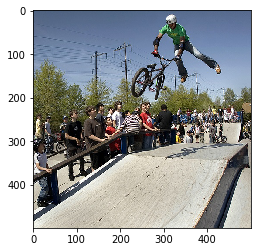

485921585_1974b1577a.jpg [[0.5083543  0.5697145  0.20866928 ... 0.45132196 0.30165225 0.44127408]] 1
Greedy: man on a bicycle high in the air
2250870111_8402d2319d.jpg [[0.07835691 0.1318186  0.35137874 ... 0.29690155 1.0908542  0.16695862]]


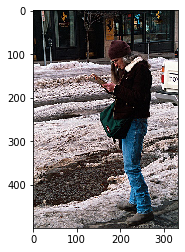

2250870111_8402d2319d.jpg [[0.07835691 0.1318186  0.35137874 ... 0.29690155 1.0908542  0.16695862]] 1
Greedy: man in a black shirt relaxes a cigarette
2795866891_7559fd8422.jpg [[0.23780021 0.53323334 0.13472834 ... 0.09091793 0.6177913  0.14025259]]


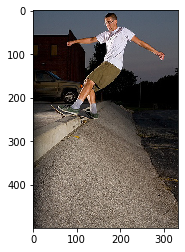

2795866891_7559fd8422.jpg [[0.23780021 0.53323334 0.13472834 ... 0.09091793 0.6177913  0.14025259]] 1
Greedy: man in a black shirt is balancing a trick on his skateboard
535399240_0714a6e950.jpg [[0.20506254 0.29262564 0.17694367 ... 0.35916215 0.37093708 0.03963755]]


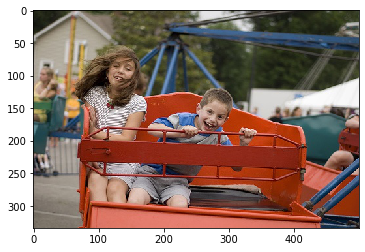

535399240_0714a6e950.jpg [[0.20506254 0.29262564 0.17694367 ... 0.35916215 0.37093708 0.03963755]] 1
Greedy: little boy is pushing a wooden machine
3375534917_62350bd06b.jpg [[0.2562152  0.06446621 0.11253153 ... 0.45946294 1.4780761  0.92602426]]


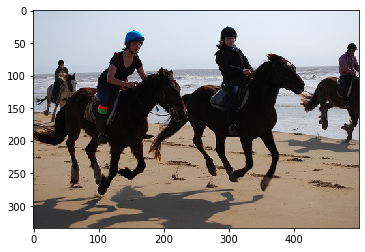

3375534917_62350bd06b.jpg [[0.2562152  0.06446621 0.11253153 ... 0.45946294 1.4780761  0.92602426]] 1
Greedy: group of people are walking on the beach by the ocean
3021780428_497542a072.jpg [[0.12765151 0.23537207 0.1405112  ... 0.00869921 0.21128164 0.00514523]]


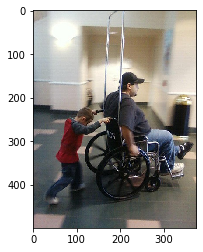

3021780428_497542a072.jpg [[0.12765151 0.23537207 0.1405112  ... 0.00869921 0.21128164 0.00514523]] 1
Greedy: man in a black shirt and hat is walking on a sidewalk with a trashcan
308956341_642589e9cc.jpg [[0.31518012 0.13148773 0.17924379 ... 0.26281878 0.08078376 0.45958355]]


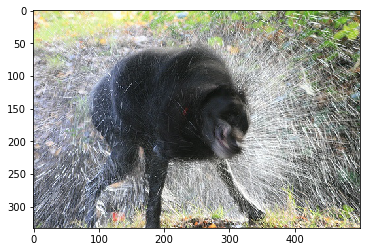

308956341_642589e9cc.jpg [[0.31518012 0.13148773 0.17924379 ... 0.26281878 0.08078376 0.45958355]] 1
Greedy: black dog is running through a stream
3163323414_d1ce127aa6.jpg [[0.70495945 0.8553528  0.437157   ... 0.06864469 0.52734363 0.60553926]]


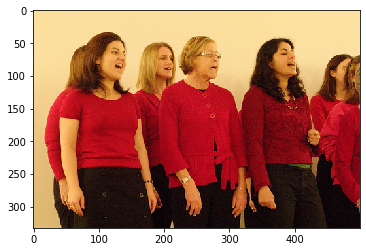

3163323414_d1ce127aa6.jpg [[0.70495945 0.8553528  0.437157   ... 0.06864469 0.52734363 0.60553926]] 1
Greedy: young girl in a white shirt is standing on a crowded street
2719102611_fef453bf30.jpg [[0.19781847 0.09603233 0.3047547  ... 0.20531324 0.39574844 0.7770789 ]]


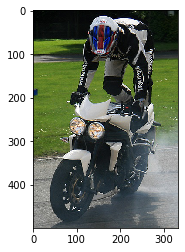

2719102611_fef453bf30.jpg [[0.19781847 0.09603233 0.3047547  ... 0.20531324 0.39574844 0.7770789 ]] 1
Greedy: motorcycle driver is turning his hand he is racing


In [65]:
print(len(train_features))

max_length = 0

for text in corpus:
    max_length = max(max_length, len(text.split(' ')))

print(max_length)


import matplotlib.pyplot as plt

last = 1
for i in range(1, 10):
    pic = list(train_features.keys())[(last*23)%6000]
    last = (last*23)%6000
    image = train_features[pic].reshape((1,2048))
    print(pic, image)
    x=plt.imread("./train/" + pic)
    plt.imshow(x)
    plt.show()
    print(pic, image, len(image))
    print("Greedy:",greedySearch(image))

In [39]:
model = keras.applications.InceptionV3(weights='imagenet')

model_new = keras.models.Model(model1.input, model.layers[-2].output)

In [47]:
from time import time
from pickle import load, dump

def preprocess(image_path):
    img = keras.preprocessing.image.load_img(image_path, target_size=(299, 299))
    x = keras.preprocessing.image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = keras.applications.inception_v3.preprocess_input(x)
    return x

def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

start = time()
encoding_test = {}
cnt = 0
print(cnt)
for img_path in glob.glob("./dataset-flick8k/*/*"):
#     print(img_path)
    img = img_path[25:]
#     print(img)
#     break;
    if img not in train_images:
        encoding_test[img] = encode(img_path)
        cnt = cnt + 1
        if cnt == 1:
            print(time()-start)
        if cnt%100 == 0:
            print(cnt)
            print("Time taken in seconds =", time()-start)
print(cnt)
print("Time taken in seconds =", time()-start)

with open("./encoded_test_images.pkl", "wb") as encoded_pickle:
    dump(encoding_test, encoded_pickle)

0
0.18397903442382812
100
Time taken in seconds = 16.889137506484985
200
Time taken in seconds = 42.677757024765015
300
Time taken in seconds = 66.93864703178406
400
Time taken in seconds = 92.94056248664856
500
Time taken in seconds = 117.97133016586304
600
Time taken in seconds = 142.75295090675354
700
Time taken in seconds = 170.19636583328247
800
Time taken in seconds = 197.02866959571838
900
Time taken in seconds = 222.58991885185242
1000
Time taken in seconds = 248.56075859069824
1100
Time taken in seconds = 274.19175910949707
1200
Time taken in seconds = 299.72210693359375
1300
Time taken in seconds = 324.03850412368774
1400
Time taken in seconds = 348.7942111492157
1500
Time taken in seconds = 374.6049151420593
1600
Time taken in seconds = 400.32517075538635
1700
Time taken in seconds = 428.47231364250183
1800
Time taken in seconds = 455.05685901641846
1900
Time taken in seconds = 496.8927381038666
2000
Time taken in seconds = 534.2603843212128
2091
Time taken in seconds = 561.

In [49]:
with open("./encoded_test_images.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

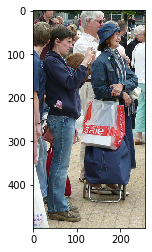

1295698260_e10c53c137.jpg [[0.17465973 0.6406467  0.2657236  ... 0.07469642 0.6897996  0.0227503 ]] 1
Greedy: man in a black shirt is walking down a street with a woman in a white shirt


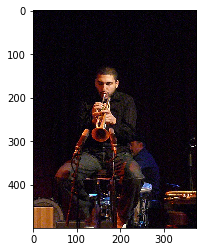

3247500085_c4f641aa84.jpg [[0.09226262 0.1126992  0.54250014 ... 0.99267673 0.29969072 0.6758368 ]] 1
Greedy: man is playing a guitar


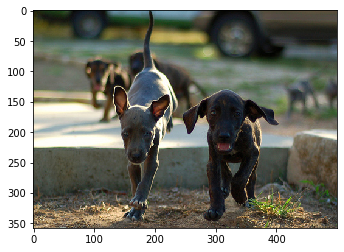

2709359730_13bca100af.jpg [[0.2833266  0.21916354 0.1458763  ... 0.37716958 0.03031522 0.36792356]] 1
Greedy: brown dog is running through the grass


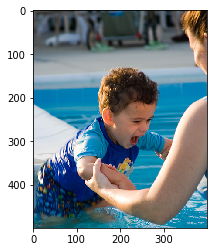

1501985304_8c50093004.jpg [[0.28755894 0.20756938 0.12407543 ... 1.0517588  0.07791088 0.22789969]] 1
Greedy: boy in a green shirt is jumping into a swimming pool


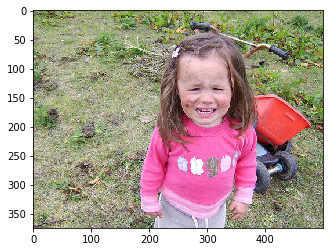

2577972703_a22c5f2a87.jpg [[0.17337632 0.19064473 0.11394824 ... 0.5077466  0.15414956 0.02210641]] 1
Greedy: little boy is sitting on a shovel with his head around a pull


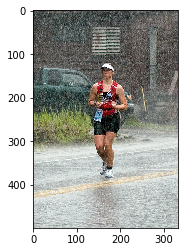

2698666984_13e17236ae.jpg [[0.25889397 0.28952992 0.23793605 ... 0.08853371 0.43440142 0.52825195]] 1
Greedy: man in a wetsuit is walking on a sidewalk with a dog in the background


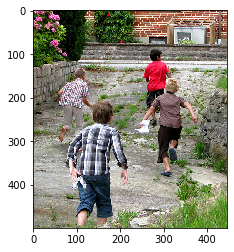

2772084628_c0ae29d87a.jpg [[0.44731003 1.150527   0.86835825 ... 0.11161364 1.6124097  0.4048459 ]] 1
Greedy: man and a woman are walking down a road away from a pond


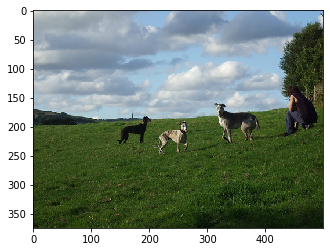

1032122270_ea6f0beedb.jpg [[0.35767186 0.3499356  0.49749723 ... 0.21691494 1.3482782  1.0504991 ]] 1
Greedy: white dog is running through a field


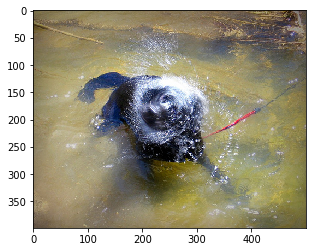

2490687446_9d46fdf5a9.jpg [[0.15685013 0.2583057  0.0185388  ... 0.56289494 0.32436723 0.06402677]] 1
Greedy: black dog is jumping into the water


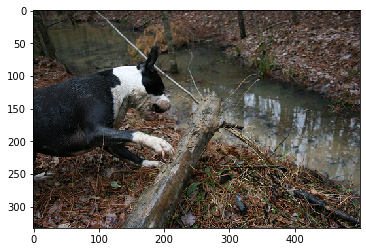

3393152604_27bd1037f2.jpg [[0.49335015 0.6931927  0.19915684 ... 0.7945522  1.1435807  0.5881576 ]] 1
Greedy: black dog is running through a field


In [66]:
last = 1
for i in range(0,10):
    pic = list(encoding_test.keys())[(last*23)%len(encoding_test)]
    last = (last*23)%len(encoding_test)
    image = encoding_test[pic].reshape((1,2048))
    x=plt.imread("./dataset-flick8k/Images/" + pic)
    plt.imshow(x)
    plt.show()
    print(pic, image, len(image))
    print("Greedy:",greedySearch(image))